In [ ]:
from coco_grape.utils.artificial_graph_constructor import ArtificialGraphDatasetConstructor
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
%load_ext autoreload
%autoreload 2
import numpy as np
import scipy as sp
import pandas as pd
import networkx as nx
import random
import matplotlib.pyplot as plt
# import warnings filter
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)
from IPython.core.display import HTML
HTML('<style>.container { width:95% !important; }</style><style>.output_png {display: table-cell;text-align: center;vertical-align: middle;}</style>')
import pulp
import sys
import pulp
# sys.path.insert(0, '/lustre/home/cs843/miniconda3/envs/diffussion/lib/python3.1/site-packages')
sys.path.insert(0, '/lustre/home/cs843/miniconda3/envs/diffussion/lib/python3.10/site-packages')
import site, importlib.util
print("PY:", sys.executable)
print("site:", site.getsitepackages() if hasattr(site,"getsitepackages") else "n/a")
print("pulp spec:", importlib.util.find_spec("pulp"))


PY: /home/links/cs843/miniconda3/bin/python
site: ['/home/links/cs843/miniconda3/lib/python3.12/site-packages']
pulp spec: ModuleSpec(name='pulp', loader=<_frozen_importlib_external.SourceFileLoader object at 0x7f2701d9ff50>, origin='/home/links/cs843/miniconda3/lib/python3.12/site-packages/pulp/__init__.py', submodule_search_locations=['/home/links/cs843/miniconda3/lib/python3.12/site-packages/pulp'])


In [ ]:
dataset_name = "my_dataset"


In [ ]:
import torch
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"CUDA version built with PyTorch: {torch.version.cuda}")
    print(f"Number of GPUs: {torch.cuda.device_count()}")
    print(f"Current GPU name: {torch.cuda.get_device_name(torch.cuda.current_device())}")
else:
    print("PyTorch was not built with CUDA support or CUDA is not configured correctly.")
import warnings
warnings.filterwarnings("ignore", message=".*PossibleUserWarning.*")
warnings.filterwarnings("ignore", message=".*does not have many workers.*")
warnings.filterwarnings("ignore", message=".*to enable TensorBoard support.*")

import os, sys
sys.stderr = open(os.devnull, 'w')

PyTorch version: 2.4.0+cu118
CUDA available: True
CUDA version built with PyTorch: 11.8
Number of GPUs: 1
Current GPU name: NVIDIA A2


In [ ]:

# DATASET_TYPE = None


In [ ]:
def offset_neg_graphs(graphs, targets, offset=10):
    out_graphs = []
    for graph, target in zip(graphs, targets):
        if target == 0:
            for u in graph.nodes():
                graph.nodes[u]['display_label'] = graph.nodes[u].get('label', 0)
                graph.nodes[u]['label'] += offset
        for u in graph.nodes():
            if 'display_label' not in graph.nodes[u]:
                graph.nodes[u]['display_label'] = graph.nodes[u].get('label', 0)
        out_graphs.append(graph.copy())
    return out_graphs, targets
def select_pos_neg(sampled_graphs, sampled_targets, n_lines=3, n_graphs_per_line=12):
    import random
    k = n_graphs_per_line * n_lines
    pos_candidates = [g for g, t in zip(sampled_graphs, sampled_targets) if t == 1]
    neg_candidates = [g for g, t in zip(sampled_graphs, sampled_targets) if t != 1]
    pos_graphs = random.sample(pos_candidates, k=min(k, len(pos_candidates)))
    neg_graphs = random.sample(neg_candidates, k=min(k, len(neg_candidates)))
    return pos_graphs, neg_graphs

In [ ]:
import hashlib
import math
import matplotlib.pyplot as plt
import networkx as nx





def split_pos_neg_graphs(graphs, graph_label_attr="label", positive_value=1, negative_value=0):
    """
    Split graphs by graph-level G.graph['label'].
    Positive: label == positive_value
    Negative: label == negative_value
    """
    pos_graphs = []
    neg_graphs = []

    for G in graphs:
        y = G.graph.get(graph_label_attr, None)
        if y == positive_value:
            pos_graphs.append(G)
        elif y == negative_value:
            neg_graphs.append(G)

    return pos_graphs, neg_graphs


In [ ]:
import hashlib
import math
import colorsys
import matplotlib.pyplot as plt
import networkx as nx


DEFAULT_MOTIF_LABEL_COLORS = {
    # Three node classes: target / connector / context.
    0: "#d62828",
    1: "#1f77b4",
    2: "#16a34a",
    # Backward-compatible shaded palette for older 9-label runs.
    3: "#d7ecff",
    4: "#7db7f0",
    5: "#1f77b4",
    6: "#dcfce7",
    7: "#86efac",
    8: "#16a34a",
}

DEFAULT_MOTIF_EDGE_COLORS = {
    # Edge alphabet of size 3: target / connector / context.
    0: "#d62828",
    1: "#1f77b4",
    2: "#16a34a",
    # Optional shaded edge alphabet of size 9.
    3: "#d7ecff",
    4: "#7db7f0",
    5: "#1f77b4",
    6: "#dcfce7",
    7: "#86efac",
    8: "#16a34a",
}


def motif_color_for_label(value):
    if value is None:
        return None
    try:
        numeric = float(value)
    except (TypeError, ValueError):
        return None
    if not numeric.is_integer():
        return None
    label = int(numeric)
    active_map = globals().get("LABEL_TO_COLOR", {})
    if label in active_map:
        return active_map[label]
    return DEFAULT_MOTIF_LABEL_COLORS.get(label)


def motif_edge_color_for_label(value):
    if value is None:
        return None
    try:
        numeric = float(value)
    except (TypeError, ValueError):
        return None
    if not numeric.is_integer():
        return None
    label = int(numeric)
    active_map = globals().get("EDGE_LABEL_TO_COLOR", {})
    if label in active_map:
        return active_map[label]
    return DEFAULT_MOTIF_EDGE_COLORS.get(label)


def stable_node_color(value, saturation=0.46, lightness=0.72):
    label = "__MISSING__" if value is None else str(value)
    digest = hashlib.sha256(label.encode("utf-8")).digest()

    h = int.from_bytes(digest[:8], "big")
    raw_hue = h / 2**64

    cool_bands = [
        (0.50, 0.62),  # cyan/blue
        (0.42, 0.50),  # teal
        (0.30, 0.42),  # green
        (0.62, 0.74),  # blue/violet
        (0.74, 0.80),  # violet
    ]
    band = cool_bands[digest[8] % len(cool_bands)]
    hue = band[0] + raw_hue * (band[1] - band[0])

    sat_jitter = (digest[9] / 255.0 - 0.5) * 0.08
    lit_jitter = (digest[10] / 255.0 - 0.5) * 0.08

    s = max(0.32, min(0.62, saturation + sat_jitter))
    l = max(0.62, min(0.82, lightness + lit_jitter))

    return colorsys.hls_to_rgb(hue, l, s)


def stable_edge_color(value=None, default_gray="#c9c9c9"):
    return default_gray


def plot_networkx_graphs(
    graphs,
    n_cols=4,
    figsize_per_graph=(3.2, 2.8),
    node_label_attr="label",
    edge_label_attr="label",
    graph_title_attr="label",
    with_node_text=True,
    with_edge_text=False,
    seed=42,
    node_size=230,
    edge_width=2.6,
    font_size=8,
    layout="kamada_kawai",
    node_color_attr="plot_color",
    edge_color_attr="plot_color",
):
    graphs = list(graphs)
    if len(graphs) == 0:
        print("No graphs to plot.")
        return

    n_cols = max(1, min(n_cols, len(graphs)))
    n_rows = math.ceil(len(graphs) / n_cols)

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(figsize_per_graph[0] * n_cols, figsize_per_graph[1] * n_rows),
        squeeze=False,
    )
    axes = axes.ravel()

    for ax, G in zip(axes, graphs):
        ax.axis("off")

        if G.number_of_nodes() == 0:
            ax.set_title("empty graph", fontsize=10)
            continue

        if layout == "kamada_kawai":
            pos = nx.kamada_kawai_layout(G)
        elif layout == "spring":
            pos = nx.spring_layout(G, seed=seed, k=0.8, iterations=80)
        elif layout == "circular":
            pos = nx.circular_layout(G)
        else:
            raise ValueError("layout must be 'kamada_kawai', 'spring', or 'circular'")

        node_labels = {
            n: G.nodes[n].get(node_label_attr, None)
            for n in G.nodes()
        }
        node_colors = [
            G.nodes[n].get(node_color_attr)
            or motif_color_for_label(node_labels[n])
            or motif_color_for_label(G.nodes[n].get("label", None))
            or motif_color_for_label(G.nodes[n].get("plot_label", None))
            or stable_node_color(node_labels[n])
            for n in G.nodes()
        ]

        edge_labels = {
            (u, v): data.get(edge_label_attr, None)
            for u, v, data in G.edges(data=True)
        }
        edge_colors = [
            G.edges[u, v].get(edge_color_attr)
            or motif_edge_color_for_label(edge_labels[(u, v)])
            or motif_edge_color_for_label(G.edges[u, v].get("label", None))
            or motif_edge_color_for_label(G.edges[u, v].get("plot_label", None))
            or stable_edge_color(edge_labels[(u, v)])
            for u, v in G.edges()
        ]

        nx.draw_networkx_edges(
            G,
            pos,
            ax=ax,
            edge_color=edge_colors,
            width=edge_width,
            alpha=0.9,
        )

        nx.draw_networkx_nodes(
            G,
            pos,
            ax=ax,
            node_color=node_colors,
            node_size=node_size,
            linewidths=0.8,
            edgecolors="#333333",
        )

        if with_node_text:
            nx.draw_networkx_labels(
                G,
                pos,
                labels={n: str(node_labels[n]) for n in G.nodes()},
                ax=ax,
                font_size=font_size,
                font_color="black",
            )

        if with_edge_text:
            nx.draw_networkx_edge_labels(
                G,
                pos,
                edge_labels={e: str(lbl) for e, lbl in edge_labels.items()},
                ax=ax,
                font_size=max(6, font_size - 1),
            )

        title = G.graph.get(graph_title_attr, "")
        ax.set_title(str(title), fontsize=10)

    for ax in axes[len(graphs):]:
        ax.axis("off")

    plt.tight_layout(pad=0.3)
    plt.show()


In [ ]:
DATASET_TYPE = 'MOLECULAR'
DATASET_TYPE = 'ARTIFICIAL'


artificial motif-aware generator enabled
graph types: ['path', 'tree', 'cycle', 'degree', 'regular', 'dense']
motif config: {'target_type': 'cycle', 'connector_type': 'path', 'context_type': 'tree', 'target_size': (4, 7), 'connector_size': (2, 7), 'branch_count': (2, 6), 'leg_len': (1, 3), 'branch_lengths': None, 'context_size': (4, 8), 'total_nodes': 15}
edge config: {'set_edge_labels': True, 'edge_alphabet': [0, 1, 2], 'default_edge_label': 0, 'edge_color_mode': 'label'}
node alphabet: [0, 1, 2] size: 3
edge alphabet: [0, 1, 2]
roles:
  target     labels: [0] colors: ['#d62828']
  connector  labels: [1] colors: ['#1f77b4']
  context    labels: [2] colors: ['#16a34a']
#graphs: 3030
#graph targets: unlabeled
node-count range: 15 to 15
edge-count range: 15 to 15
target-type counts: Counter({'cycle': 3030})
context-type counts: Counter({'tree': 3030})
target-size counts: Counter({5: 833, 6: 766, 4: 737, 7: 694})
connector-size counts: Counter({5: 554, 3: 547, 6: 540, 4: 514, 2: 495, 7: 3

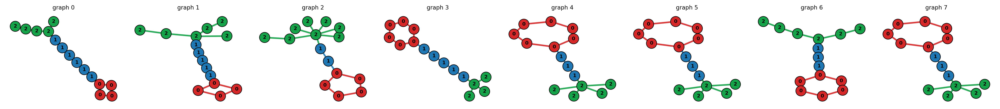

train_graphs:3000   test_graphs:30
CPU times: user 10.3 s, sys: 508 ms, total: 10.8 s
Wall time: 10.6 s


In [ ]:
%%time
import random
import math
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from collections import Counter
from sklearn.model_selection import train_test_split

test_size = 30
dataset_size = 3030
alphabet_size = None  # derived from ROLE_CONFIG below
n_graphs_per_line = 8
use_label_offset = False
plot_label_attr = "plot_label"


if DATASET_TYPE == "ARTIFICIAL":
    ARTIFICIAL_VARIABLE_SIZE = True
    targets = None

    GRAPH_TYPES = ["path", "tree", "cycle", "degree", "regular", "dense"]

    MOTIF_CONFIG = {
        "target_type": "cycle",
        "connector_type": "path",
        "context_type": "tree",
        "target_size": (4, 7),
        "connector_size": (2,7),
        "branch_count": (2, 6),
        "leg_len": (1, 3),
        "branch_lengths": None,
        "context_size": (4, 8),
        "total_nodes": 15,
    }

    # Configure the node and edge alphabets used by each motif role.
    # Simple 3-class setup: one node label and one edge label per role.
    ROLE_CONFIG = {
        "target": {
            "node_labels": [0],
            "node_colors": ["#d62828"],
            "edge_labels": [0],
            "edge_colors": ["#d62828"],
        },
        "connector": {
            "node_labels": [1],
            "node_colors": ["#1f77b4"],
            "edge_labels": [1],
            "edge_colors": ["#1f77b4"],
        },
        "context": {
            "node_labels": [2],
            "node_colors": ["#16a34a"],
            "edge_labels": [2],
            "edge_colors": ["#16a34a"],
        },
    }

    # # Previous shaded 9-class node setup, if you want it again:
    # ROLE_CONFIG = {
    #     "target": {
    #         "node_labels": [0, 1, 2],
    #         "node_colors": ["#ffd6d6", "#ff8a8a", "#d62828"],
    #         "edge_labels": [0],
    #         "edge_colors": ["#d62828"],
    #     },
    #     "connector": {
    #         "node_labels": [3, 4, 5],
    #         "node_colors": ["#d7ecff", "#7db7f0", "#1f77b4"],
    #         "edge_labels": [1],
    #         "edge_colors": ["#1f77b4"],
    #     },
    #     "context": {
    #         "node_labels": [6, 7, 8],
    #         "node_colors": ["#dcfce7", "#86efac", "#16a34a"],
    #         "edge_labels": [2],
    #         "edge_colors": ["#16a34a"],
    #     },
    # }

    # Fully custom alphabets are fine too, e.g. target [10, 11], connector [20], context [30, 31, 32].
    EDGE_CONFIG = {
        "set_edge_labels": True,
        "edge_alphabet": None,  # None derives it from ROLE_CONFIG; use [0] for unlabeled edges.
        "default_edge_label": 0,
        "edge_color_mode": "label",
    }

    def _repeat_to_length(values, n):
        values = list(values)
        if len(values) == 0:
            return ["#cccccc"] * n
        return [values[i % len(values)] for i in range(n)]

    MOTIF_LABELS = {
        role: list(spec["node_labels"])
        for role, spec in ROLE_CONFIG.items()
    }
    MOTIF_COLORS = {
        role: _repeat_to_length(spec.get("node_colors", ["#cccccc"]), len(spec["node_labels"]))
        for role, spec in ROLE_CONFIG.items()
    }
    MOTIF_EDGE_LABELS = {
        role: list(spec.get("edge_labels", [EDGE_CONFIG["default_edge_label"]]))
        for role, spec in ROLE_CONFIG.items()
    }
    MOTIF_EDGE_COLORS = {
        role: _repeat_to_length(spec.get("edge_colors", ["#555555"]), len(MOTIF_EDGE_LABELS[role]))
        for role, spec in ROLE_CONFIG.items()
    }

    NODE_ALPHABET = sorted({label for labels in MOTIF_LABELS.values() for label in labels})
    if alphabet_size is None:
        alphabet_size = len(NODE_ALPHABET)

    if EDGE_CONFIG.get("edge_alphabet") is None:
        EDGE_CONFIG["edge_alphabet"] = sorted({label for labels in MOTIF_EDGE_LABELS.values() for label in labels})

    EDGE_LABEL_BY_ROLE = {
        "target": MOTIF_EDGE_LABELS["target"][0],
        "connector": MOTIF_EDGE_LABELS["connector"][0],
        "context": MOTIF_EDGE_LABELS["context"][0],
        "connector_to_context": MOTIF_EDGE_LABELS["context"][0],
    }

    LABEL_TO_COLOR = {}
    for role, labels in MOTIF_LABELS.items():
        for i, label in enumerate(labels):
            LABEL_TO_COLOR[label] = MOTIF_COLORS[role][i]

    EDGE_LABEL_TO_COLOR = {}
    for role, labels in MOTIF_EDGE_LABELS.items():
        for i, label in enumerate(labels):
            EDGE_LABEL_TO_COLOR[label] = MOTIF_EDGE_COLORS[role][i]

    def sample_int(spec, rng):
        if isinstance(spec, tuple):
            return rng.randint(int(spec[0]), int(spec[1]))
        return int(spec)

    def motif_label_color(role, idx, phase=0):
        labels = MOTIF_LABELS[role]
        colors = MOTIF_COLORS[role]
        k = (idx + phase) % len(labels)
        return labels[k], colors[k]

    def add_motif_node(G, u, role, idx, phase=0, motif_type=None, **extra):
        label, color = motif_label_color(role, idx, phase)
        G.add_node(
            u,
            label=label,
            plot_label=label,
            plot_color=color,
            motif=role,
            motif_role=role,
            motif_type=motif_type,
            **extra,
        )

    def edge_label_color(role, idx=0, phase=0):
        edge_alphabet = list(EDGE_CONFIG.get("edge_alphabet", [0]))
        default_label = EDGE_CONFIG.get(
            "default_edge_label",
            edge_alphabet[0] if edge_alphabet else 0,
        )
        set_edge_labels = bool(EDGE_CONFIG.get("set_edge_labels", True))
        color_mode = EDGE_CONFIG.get("edge_color_mode", "label")

        if (not set_edge_labels) or len(edge_alphabet) <= 1:
            return default_label, "#555555"

        color_role = "context" if role == "connector_to_context" else role
        role_labels = MOTIF_EDGE_LABELS.get(color_role, [default_label])
        role_colors = MOTIF_EDGE_COLORS.get(color_role, ["#555555"])
        k = (idx + phase) % len(role_labels)
        candidate_label = role_labels[k]
        candidate_color = role_colors[k]

        if candidate_label in edge_alphabet:
            label = candidate_label
        else:
            label = edge_alphabet[(idx + phase) % len(edge_alphabet)]

        if color_mode == "label":
            color = EDGE_LABEL_TO_COLOR.get(label, candidate_color)
        else:
            color = "#555555"

        return label, color

    def add_motif_edge(G, u, v, role, motif_type=None, idx=0, phase=0):
        label, color = edge_label_color(role, idx=idx, phase=phase)

        G.add_edge(
            u,
            v,
            label=label,
            plot_label=label,
            plot_color=color,
            motif=role,
            motif_role=role,
            motif_type=motif_type,
        )

    def positive_partition(total, n_parts, rng):
        if total <= 0:
            return []
        n_parts = max(1, min(int(n_parts), int(total)))
        if n_parts == 1:
            return [int(total)]
        cuts = sorted(rng.sample(range(1, int(total)), n_parts - 1))
        return [b - a for a, b in zip([0] + cuts, cuts + [int(total)])]

    def random_branch_lengths(total, branch_count, leg_len_spec, rng):
        if total <= 0:
            return []

        lengths = []
        remaining = int(total)
        branch_count = max(1, int(branch_count))

        for b in range(branch_count):
            branches_left = branch_count - b

            if branches_left == 1:
                length = remaining
            else:
                low = 1
                high = max(1, remaining - (branches_left - 1))

                if isinstance(leg_len_spec, tuple):
                    low = max(low, int(leg_len_spec[0]))
                    high = min(high, int(leg_len_spec[1]))
                else:
                    low = high = int(leg_len_spec)

                if low > high:
                    length = max(1, min(remaining - (branches_left - 1), remaining))
                else:
                    length = rng.randint(low, high)

            lengths.append(length)
            remaining -= length

            if remaining <= 0:
                break

        if remaining > 0:
            lengths[-1] += remaining

        return lengths

    def _new_nodes(G, n, role, motif_type, rng, phase):
        nodes = []
        for k in range(int(n)):
            u = len(G)
            add_motif_node(G, u, role, k, phase, motif_type=motif_type)
            nodes.append(u)
        return nodes

    def add_structured_motif(G, n, role, motif_type, rng, phase, attach_to=None):
        motif_type = str(motif_type).lower()

        if motif_type not in GRAPH_TYPES:
            raise ValueError(f"Unknown motif_type={motif_type!r}; choose from {GRAPH_TYPES}")

        n = max(1, int(n))

        if motif_type == "cycle" and n < 3:
            n = 3
        if motif_type == "regular" and n < 3:
            n = 3
        if motif_type == "dense" and n < 2:
            n = 2

        nodes = _new_nodes(G, n, role, motif_type, rng, phase)

        if attach_to is not None:
            add_motif_edge(G, attach_to, nodes[0], role, motif_type, idx=0, phase=phase)

        if motif_type == "path":
            for k, (u, v) in enumerate(zip(nodes[:-1], nodes[1:])):
                add_motif_edge(G, u, v, role, motif_type, idx=k, phase=phase)
            exit_node = nodes[-1]

        elif motif_type == "cycle":
            for k in range(n):
                add_motif_edge(G, nodes[k], nodes[(k + 1) % n], role, motif_type, idx=k, phase=phase)
            exit_node = rng.choice(nodes)

        elif motif_type == "tree":
            for k in range(1, n):
                parent = rng.choice(nodes[:k])
                add_motif_edge(G, parent, nodes[k], role, motif_type, idx=k, phase=phase)
            exit_node = nodes[-1]

        elif motif_type == "degree":
            center = nodes[0]
            for k, u in enumerate(nodes[1:], start=1):
                add_motif_edge(G, center, u, role, motif_type, idx=k, phase=phase)
            exit_node = center

        elif motif_type == "regular":
            for k in range(n):
                add_motif_edge(G, nodes[k], nodes[(k + 1) % n], role, motif_type, idx=k, phase=phase)

            if n >= 6 and n % 2 == 0:
                half = n // 2
                for k in range(half):
                    add_motif_edge(G, nodes[k], nodes[k + half], role, motif_type, idx=k + half, phase=phase)

            exit_node = rng.choice(nodes)

        elif motif_type == "dense":
            for i in range(n):
                for j in range(i + 1, n):
                    if rng.random() < 0.72:
                        add_motif_edge(G, nodes[i], nodes[j], role, motif_type, idx=i + j, phase=phase)

            if G.subgraph(nodes).number_of_edges() == 0:
                for k, (u, v) in enumerate(zip(nodes[:-1], nodes[1:])):
                    add_motif_edge(G, u, v, role, motif_type, idx=k, phase=phase)

            exit_node = rng.choice(nodes)

        return nodes, exit_node

    def add_context_tree(G, attach_to, branch_lengths, rng, phase):
        hub = len(G)

        add_motif_node(
            G,
            hub,
            "context",
            idx=0,
            phase=phase,
            motif_type="tree",
            node_role="hub",
        )

        add_motif_edge(G, attach_to, hub, "connector_to_context", "tree", idx=0, phase=phase)

        nodes = [hub]

        for b, branch_len in enumerate(branch_lengths):
            prev = hub

            for depth in range(int(branch_len)):
                u = len(G)

                add_motif_node(
                    G,
                    u,
                    "context",
                    idx=depth + b + 1,
                    phase=phase,
                    motif_type="tree",
                    branch=b,
                )

                add_motif_edge(G, prev, u, "context", "tree", idx=depth + b + 1, phase=phase)

                nodes.append(u)
                prev = u

        return nodes, hub

    def sample_graph_sizes(config, rng):
        for _ in range(200):
            total_nodes = config.get("total_nodes", None)
            total_nodes = None if total_nodes is None else sample_int(total_nodes, rng)

            target_size = sample_int(config.get("target_size", (3, 7)), rng)
            connector_size = sample_int(config.get("connector_size", (2, 6)), rng)
            context_type = config.get("context_type", "tree")

            exact_branch_lengths = config.get("branch_lengths", None)

            if context_type == "tree":
                if exact_branch_lengths is not None:
                    branch_lengths = [int(x) for x in exact_branch_lengths]
                    context_size = 1 + sum(branch_lengths)

                elif total_nodes is not None:
                    context_size = total_nodes - target_size - connector_size
                    if context_size < 2:
                        continue

                    branch_nodes = context_size - 1
                    branch_count = sample_int(config.get("branch_count", (2, 4)), rng)

                    branch_lengths = random_branch_lengths(
                        branch_nodes,
                        branch_count,
                        config.get("leg_len", (1, 3)),
                        rng,
                    )

                else:
                    branch_count = sample_int(config.get("branch_count", (2, 4)), rng)
                    branch_lengths = [
                        sample_int(config.get("leg_len", (1, 3)), rng)
                        for _ in range(branch_count)
                    ]
                    context_size = 1 + sum(branch_lengths)

            else:
                branch_lengths = None

                if total_nodes is not None:
                    context_size = total_nodes - target_size - connector_size
                    if context_size < 1:
                        continue
                else:
                    context_size = sample_int(config.get("context_size", (4, 8)), rng)

            inferred_total = target_size + connector_size + context_size

            if total_nodes is None:
                total_nodes = inferred_total

            if inferred_total == total_nodes:
                return target_size, connector_size, context_size, branch_lengths, total_nodes

        raise ValueError(
            "Could not sample valid motif sizes. Try increasing total_nodes or reducing motif-size ranges."
        )

    def make_motif_graph(config=None, seed=None, graph_id=None):
        config = dict(MOTIF_CONFIG if config is None else config)
        rng = random.Random(seed)
        G = nx.Graph()

        phases = {
            "target": rng.randint(0, 2),
            "connector": rng.randint(0, 2),
            "context": rng.randint(0, 2),
        }

        phases = {
            "target": 0,
            "connector": 0,
            "context": 0,
        }

        target_size, connector_size, context_size, branch_lengths, total_nodes = sample_graph_sizes(config, rng)

        target_nodes, target_anchor = add_structured_motif(
            G,
            n=target_size,
            role="target",
            motif_type=config.get("target_type", "cycle"),
            rng=rng,
            phase=phases["target"],
            attach_to=None,
        )

        connector_nodes, connector_exit = add_structured_motif(
            G,
            n=connector_size,
            role="connector",
            motif_type=config.get("connector_type", "path"),
            rng=rng,
            phase=phases["connector"],
            attach_to=target_anchor,
        )

        if config.get("context_type", "tree") == "tree":
            context_nodes, context_anchor = add_context_tree(
                G,
                attach_to=connector_exit,
                branch_lengths=branch_lengths,
                rng=rng,
                phase=phases["context"],
            )
        else:
            context_nodes, context_anchor = add_structured_motif(
                G,
                n=context_size,
                role="context",
                motif_type=config.get("context_type", "tree"),
                rng=rng,
                phase=phases["context"],
                attach_to=connector_exit,
            )

        G.graph["graph_id"] = graph_id
        G.graph["motif_family"] = "target_connector_context"
        G.graph["target_type"] = config.get("target_type", "cycle")
        G.graph["connector_type"] = config.get("connector_type", "path")
        G.graph["context_type"] = config.get("context_type", "tree")
        G.graph["target_size"] = target_size
        G.graph["connector_size"] = connector_size
        G.graph["context_size"] = context_size
        G.graph["branch_count"] = 0 if branch_lengths is None else len(branch_lengths)
        G.graph["branch_lengths"] = tuple([] if branch_lengths is None else branch_lengths)
        G.graph["total_nodes"] = total_nodes
        G.graph["motif_config"] = dict(config)
        G.graph["motif_label_ranges"] = dict(MOTIF_LABELS)

        return G

    def sample_motif_dataset(n_graphs, config=None, seed=7):
        rng = random.Random(seed)
        graphs = []

        for i in range(n_graphs):
            G = make_motif_graph(
                config=config,
                seed=rng.randint(0, 10**9),
                graph_id=i,
            )
            graphs.append(G)

        return graphs

    def ensure_plot_attrs(graphs):
        edge_alphabet = list(EDGE_CONFIG.get("edge_alphabet", [0]))
        default_label = EDGE_CONFIG.get(
            "default_edge_label",
            edge_alphabet[0] if edge_alphabet else 0,
        )

        for G in graphs:
            for _, data in G.nodes(data=True):
                label = data.get("label", data.get("plot_label", 0))

                data["label"] = label
                data["plot_label"] = label

                role = data.get("motif_role", data.get("motif", None))

                if role in MOTIF_LABELS and label in MOTIF_LABELS[role]:
                    idx = MOTIF_LABELS[role].index(label)
                    data["plot_color"] = MOTIF_COLORS[role][idx]
                else:
                    data["plot_color"] = LABEL_TO_COLOR.get(label, "#cccccc")

            for _, _, data in G.edges(data=True):
                if bool(EDGE_CONFIG.get("set_edge_labels", True)):
                    label = data.get("label", data.get("plot_label", default_label))
                    if label not in edge_alphabet:
                        label = default_label
                else:
                    label = default_label

                data["label"] = label
                data["plot_label"] = label

                if EDGE_CONFIG.get("edge_color_mode", "label") == "label" and len(edge_alphabet) > 1:
                    data["plot_color"] = EDGE_LABEL_TO_COLOR.get(label, "#555555")
                else:
                    data["plot_color"] = "#555555"

    def plot_motif_graphs(graphs, n_cols=8, node_size=210, edge_width=2.2):
        n_rows = math.ceil(len(graphs) / n_cols)

        fig, axes = plt.subplots(
            n_rows,
            n_cols,
            figsize=(2.45 * n_cols, 2.25 * n_rows),
            dpi=150,
        )

        axes = np.array(axes).reshape(-1)

        for i, (ax, G) in enumerate(zip(axes, graphs)):
            try:
                pos = nx.kamada_kawai_layout(G)
            except Exception:
                pos = nx.spring_layout(G, seed=42)

            node_colors = [
                G.nodes[u].get("plot_color", "#cccccc")
                for u in G.nodes()
            ]

            edge_colors = [
                G.edges[u, v].get("plot_color", "#444444")
                for u, v in G.edges()
            ]

            labels = {
                u: G.nodes[u].get("plot_label", "")
                for u in G.nodes()
            }

            nx.draw_networkx_edges(
                G,
                pos,
                ax=ax,
                edge_color=edge_colors,
                width=edge_width,
                alpha=0.9,
            )

            nx.draw_networkx_nodes(
                G,
                pos,
                ax=ax,
                node_color=node_colors,
                edgecolors="black",
                linewidths=0.8,
                node_size=node_size,
            )

            nx.draw_networkx_labels(
                G,
                pos,
                labels=labels,
                ax=ax,
                font_size=7,
                font_weight="bold",
            )

            ax.set_title(f"graph {i}", fontsize=8)
            ax.axis("off")

        for ax in axes[len(graphs):]:
            ax.axis("off")

        plt.tight_layout()
        plt.show()

    graphs = sample_motif_dataset(
        n_graphs=dataset_size,
        config=MOTIF_CONFIG,
        seed=7,
    )

    try:
        from coco_grape.utils.canonical_order import canonicalise
        graphs = [canonicalise(g) for g in graphs]
    except Exception as e:
        print("canonicalise skipped:", repr(e))

    ensure_plot_attrs(graphs)

    print("artificial motif-aware generator enabled")
    print("graph types:", GRAPH_TYPES)
    print("motif config:", MOTIF_CONFIG)
    print("edge config:", EDGE_CONFIG)
    print("node alphabet:", NODE_ALPHABET, "size:", alphabet_size)
    print("edge alphabet:", EDGE_CONFIG["edge_alphabet"])
    print("roles:")

    for role in ["target", "connector", "context"]:
        print(f"  {role:10s} labels:", MOTIF_LABELS[role], "colors:", MOTIF_COLORS[role])

    print("#graphs:", len(graphs))
    print("#graph targets: unlabeled")

    print(
        "node-count range:",
        min(g.number_of_nodes() for g in graphs),
        "to",
        max(g.number_of_nodes() for g in graphs),
    )

    print(
        "edge-count range:",
        min(g.number_of_edges() for g in graphs),
        "to",
        max(g.number_of_edges() for g in graphs),
    )

    print("target-type counts:", Counter(g.graph["target_type"] for g in graphs))
    print("context-type counts:", Counter(g.graph["context_type"] for g in graphs))
    print("target-size counts:", Counter(g.graph["target_size"] for g in graphs))
    print("connector-size counts:", Counter(g.graph["connector_size"] for g in graphs))
    print("context-size counts:", Counter(g.graph["context_size"] for g in graphs))
    print("branch-count counts:", Counter(g.graph["branch_count"] for g in graphs))
    print("edge-label counts:", Counter(d.get("label", None) for g in graphs for _, _, d in g.edges(data=True)))

    preview_graphs = random.sample(graphs, k=min(n_graphs_per_line, len(graphs)))

    plot_motif_graphs(
        preview_graphs,
        n_cols=n_graphs_per_line,
        node_size=210,
        edge_width=2.2,
    )


elif DATASET_TYPE == "MOLECULAR":
    from coco_grape.visualizer.mol_display import draw_molecules
    from coco_grape.data_loader.mol.mol_loader import PubChemLoader
    from coco_grape.data_loader.loader import SupervisedDataSetLoader

    assay_id = "463230"

    def pubchem_loader():
        return PubChemLoader().load(assay_id)

    original_graphs, original_targets = SupervisedDataSetLoader(
        pubchem_loader,
        size=dataset_size,
        use_equalized=False,
    ).load()

    original_graphs = np.array(original_graphs, dtype=object)
    original_targets = np.array(original_targets)

    print("#graphs:%d   class split:%s" % (
        len(original_graphs),
        np.bincount(original_targets),
    ))

    max_node_size = 19
    print("...filter by size <= %d" % max_node_size)

    idxs = [
        idx
        for idx, graph in enumerate(original_graphs)
        if nx.number_of_nodes(graph) <= max_node_size
    ]

    print("#graphs:%d " % len(idxs))

    graphs = original_graphs[idxs].tolist()
    targets = original_targets[idxs]

    draw_molecules(graphs[:7 * 2])


BALANCED_TEST_SET = True


def balanced_train_test_split_graphs(graphs, targets, test_size=10, seed=42):
    graphs = list(graphs)
    targets = list(targets)
    rng = random.Random(int(seed))

    by_class = {}

    for idx, y in enumerate(targets):
        by_class.setdefault(y, []).append(idx)

    classes = sorted(by_class.keys(), key=lambda x: repr(x))
    n_classes = len(classes)

    if n_classes < 2:
        train_graphs, test_graphs, train_targets, test_targets = train_test_split(
            graphs,
            targets,
            test_size=test_size,
            random_state=seed,
        )
        return train_graphs, test_graphs, train_targets, test_targets

    total_test = int(test_size)

    if total_test < n_classes:
        total_test = n_classes

    base = total_test // n_classes
    rem = total_test % n_classes

    selected_test = []

    for j, cls in enumerate(classes):
        idxs = list(by_class[cls])
        rng.shuffle(idxs)

        want = base + (1 if j < rem else 0)
        max_take = max(1, len(idxs) - 1) if len(idxs) > 1 else 1
        take = min(want, max_take)

        selected_test.extend(idxs[:take])

    selected_set = set(selected_test)

    if len(selected_test) < total_test:
        remaining = [
            i
            for i in range(len(graphs))
            if i not in selected_set
        ]

        rng.shuffle(remaining)

        selected_test.extend(
            remaining[:total_test - len(selected_test)]
        )

        selected_set = set(selected_test)

    train_idx = [
        i
        for i in range(len(graphs))
        if i not in selected_set
    ]

    test_idx = list(selected_test)

    return (
        [graphs[i] for i in train_idx],
        [graphs[i] for i in test_idx],
        [targets[i] for i in train_idx],
        [targets[i] for i in test_idx],
    )


if targets is None:
    train_graphs, test_graphs = train_test_split(
        graphs,
        test_size=test_size,
        random_state=42,
    )
    train_targets = None
    test_targets = None
else:
    if BALANCED_TEST_SET:
        train_graphs, test_graphs, train_targets, test_targets = balanced_train_test_split_graphs(
            graphs,
            targets,
            test_size=test_size,
            seed=42,
        )
    else:
        train_graphs, test_graphs, train_targets, test_targets = train_test_split(
            graphs,
            targets,
            test_size=test_size,
            random_state=42,
            stratify=targets if len(set(targets)) > 1 else None,
        )

print(f"train_graphs:{len(train_graphs)}   test_graphs:{len(test_graphs)}")

if targets is not None:
    print("train class counts:", Counter(train_targets))
    print("test class counts :", Counter(test_targets))

In [ ]:
from collections import Counter
import networkx as nx
import matplotlib.pyplot as plt

def plot_label_comparative_histogram(
    probe_train_graphs,
    decoded_graphs,
    conditioning_decoded_graphs,
    labels=('Probe Train Graphs', 'Decoded Graphs', 'Conditioning Decoded Graphs'),
    title='Comparative Histogram of Node Labels Across Graph Sets',
    figsize=(12, 6),
    bar_edgecolor='black',
    annotate=True,
    annotate_offset=3  # points above the bar
):
    """
    Plots a grouped bar chart comparing node 'label' attribute frequencies
    across three lists of networkx graphs.
    """

    def _norm_label(x):
        # Make everything a stable, comparable string key
        try:
            hash(x)            # ensure hashable; if not, fall back to repr
        except TypeError:
            x = repr(x)
        return str(x)

    def _get_label_counts(graph_list):
        counts = Counter()
        for G in graph_list:
            for v in nx.get_node_attributes(G, 'label').values():
                counts[_norm_label(v)] += 1
        return counts

    # Compute normalized label counts
    counts_list = [
        _get_label_counts(probe_train_graphs),
        _get_label_counts(decoded_graphs),
        _get_label_counts(conditioning_decoded_graphs)
    ]

    # Union of all stringified labels, sorted lexicographically
    all_labels = sorted(set().union(*[c.keys() for c in counts_list]))
    x = range(len(all_labels))
    width = 0.25

    # Align counts to all_labels order
    vals = [[c.get(lbl, 0) for lbl in all_labels] for c in counts_list]

    # Plot
    fig, ax = plt.subplots(figsize=figsize)
    bars1 = ax.bar([i - width for i in x], vals[0], width=width,
                   label=labels[0], edgecolor=bar_edgecolor)
    bars2 = ax.bar(x,               vals[1], width=width,
                   label=labels[1], edgecolor=bar_edgecolor)
    bars3 = ax.bar([i + width for i in x], vals[2], width=width,
                   label=labels[2], edgecolor=bar_edgecolor)

    # Annotate counts
    if annotate:
        for bar in list(bars1) + list(bars2) + list(bars3):
            height = bar.get_height()
            ax.annotate(
                f'{int(height)}',
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, annotate_offset),
                textcoords="offset points",
                ha='center',
                va='bottom'
            )

    ax.set_xticks(list(x))
    ax.set_xticklabels(all_labels, rotation=0, ha='right')
    ax.set_xlabel('Node Label')
    ax.set_ylabel('Frequency')
    ax.set_title(title)
    ax.legend()
    fig.tight_layout()
    plt.show()

# === WL & NSPDK MMD from NetworkX graphs (one cell) ==========================
import numpy as np, networkx as nx

def _to_simple_undirected(G):
    H = nx.Graph(G) if isinstance(G, (nx.DiGraph, nx.MultiDiGraph)) else G.copy()
    H.remove_edges_from(nx.selfloop_edges(H))
    return H

def _nonempty(graphs):
    return [G for G in graphs if _to_simple_undirected(G).number_of_nodes() > 0]

# ---------------- GraKeL conversion: build Graph objects ---------------------
def nx_to_grakel_wl(graphs, node_label_key="label"):
    """For WL+VertexHistogram: Graph(adjacency, node_labels, None)."""
    from grakel import Graph
    glist = []
    for G in _nonempty(graphs):
        H = _to_simple_undirected(G)
        nodes = list(H.nodes())
        n = len(nodes)
        idx = {u: i for i, u in enumerate(nodes)}
        A = np.zeros((n, n), dtype=int)
        for u, v in H.edges():
            i, j = idx[u], idx[v]
            A[i, j] = 1; A[j, i] = 1
        # node labels: use provided key if present, else a constant label "0"
        if all(node_label_key in H.nodes[u] for u in nodes):
            vlab = {idx[u]: str(H.nodes[u][node_label_key]) for u in nodes}
        else:
            vlab = {i: "0" for i in range(n)}
        glist.append(Graph(A, vlab, None))  # <-- removed directed kwarg
    return glist

def nx_to_grakel_nspdk(graphs, node_label_key="label"):
    """For NSPDK: Graph(adjacency, node_labels, edge_labels). Edge labels set to '1'."""
    from grakel import Graph
    glist = []
    for G in _nonempty(graphs):
        H = _to_simple_undirected(G)
        nodes = list(H.nodes())
        n = len(nodes)
        idx = {u: i for i, u in enumerate(nodes)}
        A = np.zeros((n, n), dtype=int)
        for u, v in H.edges():
            i, j = idx[u], idx[v]
            A[i, j] = 1; A[j, i] = 1
        # node labels: provided if present, else "0"
        if all(node_label_key in H.nodes[u] for u in nodes):
            vlab = {idx[u]: str(H.nodes[u][node_label_key]) for u in nodes}
        else:
            vlab = {i: "0" for i in range(n)}
        # edge labels: constant '1' on existing edges (both directions)
        elab = {}
        for u, v in H.edges():
            i, j = idx[u], idx[v]
            elab[(i, j)] = '1'
            elab[(j, i)] = '1'
        glist.append(Graph(A, vlab, elab))  # <-- removed directed kwarg
    return glist

# ---------------- MMD utilities ----------------------------------------------
def _mmd2_unbiased(Kxx, Kyy, Kxy):
    m, n = Kxx.shape[0], Kyy.shape[0]
    if m < 2 or n < 2: return np.nan, np.nan
    Kxx = Kxx.copy(); Kyy = Kyy.copy()
    np.fill_diagonal(Kxx, 0.0); np.fill_diagonal(Kyy, 0.0)
    term_x = Kxx.sum()/(m*(m-1))
    term_y = Kyy.sum()/(n*(n-1))
    term_xy = 2.0*Kxy.sum()/(m*n)
    mmd2 = term_x + term_y - term_xy
    return float(mmd2), float(np.sqrt(max(mmd2, 0.0)))

# ---------------- WL (VertexHistogram) MMD -----------------------------------
def wl_mmd(true_graphs, gen_graphs, node_label_key="label", n_iter=5, normalize=True):
    try:
        from grakel.kernels import WeisfeilerLehman, VertexHistogram
    except Exception as e:
        raise RuntimeError("GraKeL not installed. pip install grakel") from e
    Gx = nx_to_grakel_wl(true_graphs, node_label_key)
    Gy = nx_to_grakel_wl(gen_graphs,  node_label_key)
    if len(Gx) == 0 or len(Gy) == 0:
        return {"wl_mmd": np.nan, "wl_mmd2": np.nan, "note": "empty after parsing"}
    base_spec = (VertexHistogram, {"normalize": normalize})
    wl_x = WeisfeilerLehman(n_iter=n_iter, base_graph_kernel=base_spec, normalize=normalize)
    Kxx = wl_x.fit_transform(Gx)
    Kxy = wl_x.transform(Gy)
    wl_y = WeisfeilerLehman(n_iter=n_iter, base_graph_kernel=base_spec, normalize=normalize)
    Kyy = wl_y.fit_transform(Gy)
    mmd2, mmd = _mmd2_unbiased(Kxx, Kyy, Kxy)
    return {"wl_mmd": mmd, "wl_mmd2": mmd2, "wl_n_iter": n_iter}

# ---------------- NSPDK MMD ---------------------------------------------------
def nspdk_mmd(true_graphs, gen_graphs, node_label_key="label", r=1, d=6, normalize=True, n_jobs=-1):
    try:
        from grakel.kernels import NeighborhoodSubgraphPairwiseDistance as NSPDK
    except Exception as e:
        raise RuntimeError("GraKeL not installed. pip install grakel") from e
    Gx = nx_to_grakel_nspdk(true_graphs, node_label_key)
    Gy = nx_to_grakel_nspdk(gen_graphs,  node_label_key)
    if len(Gx) == 0 or len(Gy) == 0:
        return {"nspdk_mmd": np.nan, "nspdk_mmd2": np.nan, "note": "empty after parsing"}
    K = NSPDK(r=r, d=d, normalize=normalize, n_jobs=n_jobs)
    Kxx = K.fit_transform(Gx)
    Kxy = K.transform(Gy)
    Ky = NSPDK(r=r, d=d, normalize=normalize, n_jobs=n_jobs)
    Kyy = Ky.fit_transform(Gy)
    mmd2, mmd = _mmd2_unbiased(Kxx, Kyy, Kxy)
    return {"nspdk_mmd": mmd, "nspdk_mmd2": mmd2, "nspdk_r": r, "nspdk_d": d}

# # ---------------- Example run on your three sets ------------------------------
# # Assumes you already have: probe_train_graphs, decoded_graphs, conditioning_decoded_graphs
# wl_true_vs_nodes = wl_mmd(probe_train_graphs, decoded_graphs, n_iter=5, normalize=True)
# wl_true_vs_cond  = wl_mmd(probe_train_graphs, conditioning_decoded_graphs, n_iter=5, normalize=True)
# ns_true_vs_nodes = nspdk_mmd(probe_train_graphs, decoded_graphs, r=1, d=4, normalize=True)
# ns_true_vs_cond  = nspdk_mmd(probe_train_graphs, conditioning_decoded_graphs, r=1, d=4, normalize=True)

# print("WL  (true vs nodes):", wl_true_vs_nodes)
# print("WL  (true vs cond) :", wl_true_vs_cond)
# print("NSPDK (true vs nodes):", ns_true_vs_nodes)
# print("NSPDK (true vs cond) :", ns_true_vs_cond)


In [ ]:
# ===== Optional split train into train1/train2, keep existing test split =====

from collections import Counter
from sklearn.model_selection import train_test_split

DO_TRAIN_SPLIT = True
USE_TRAIN1_FOR_DOWNSTREAM = False

if DO_TRAIN_SPLIT:

    def _ensure_nsppk_labels(graphs, default_node_label=0, default_edge_label=0):
        out = []
        d = int(default_node_label)
        de = int(default_edge_label)

        for g in graphs:
            h = g.copy()

            for u in h.nodes():
                attrs = h.nodes[u]
                raw = attrs.get('label', attrs.get('display_label', attrs.get('true_label', d)))
                try:
                    lbl = int(raw)
                except Exception:
                    lbl = d

                attrs['label'] = lbl
                attrs['display_label'] = int(attrs.get('display_label', lbl)) if str(attrs.get('display_label', lbl)).lstrip('-').isdigit() else lbl
                attrs['true_label'] = int(attrs.get('true_label', lbl)) if str(attrs.get('true_label', lbl)).lstrip('-').isdigit() else lbl

            for u, v in h.edges():
                eattrs = h.edges[u, v]
                eraw = eattrs.get('label', eattrs.get('true_label', de))
                try:
                    elbl = int(eraw)
                except Exception:
                    elbl = de

                eattrs['label'] = elbl
                eattrs['true_label'] = int(eattrs.get('true_label', elbl)) if str(eattrs.get('true_label', elbl)).lstrip('-').isdigit() else elbl

            out.append(h)

        return out


    train_graphs = _ensure_nsppk_labels(train_graphs)
    test_graphs = _ensure_nsppk_labels(test_graphs)

    train_whole_graphs = [g.copy() for g in train_graphs]
    train_whole_targets = None if train_targets is None else list(train_targets)

    if train_whole_targets is None:
        train1_graphs, train2_graphs = train_test_split(
            train_whole_graphs,
            test_size=0.5,
            random_state=42,
        )
        train1_targets = None
        train2_targets = None
    else:
        counts = Counter(train_whole_targets)
        can_stratify = len(counts) > 1 and min(counts.values()) >= 2
        stratify_arg = train_whole_targets if can_stratify else None

        train1_graphs, train2_graphs, train1_targets, train2_targets = train_test_split(
            train_whole_graphs,
            train_whole_targets,
            test_size=0.5,
            random_state=42,
            stratify=stratify_arg,
        )

    if USE_TRAIN1_FOR_DOWNSTREAM:
        train_graphs = train1_graphs
        train_targets = train1_targets
        print('downstream training source: train1')
    else:
        train_graphs = train_whole_graphs
        train_targets = train_whole_targets
        print('downstream training source: train_whole')

    print('train_whole/train1/train2/test:', len(train_whole_graphs), len(train1_graphs), len(train2_graphs), len(test_graphs))
    if train_whole_targets is None:
        print('train_whole class counts: unlabeled')
        print('train1 class counts     : unlabeled')
        print('train2 class counts     : unlabeled')
        print('test class counts       : unlabeled')
    else:
        print('train_whole class counts:', Counter(train_whole_targets))
        print('train1 class counts     :', Counter(train1_targets))
        print('train2 class counts     :', Counter(train2_targets))
        print('test class counts       :', Counter(test_targets))


    # ===== Debug classifier: NSPPK on train1/train2/train1+train2 =====

    import numpy as np
    from sklearn.ensemble import ExtraTreesClassifier
    from sklearn.metrics import accuracy_score, balanced_accuracy_score, f1_score
    from coco_grape.graph_vectorizer.nsppk import NSPPK


    def _safe_f1(y_true, y_pred):
        labels = sorted(set(y_true) | set(y_pred))
        if len(labels) <= 2:
            return float(f1_score(y_true, y_pred, zero_division=0))
        return float(f1_score(y_true, y_pred, average='macro', zero_division=0))


    def _evaluate_split_repeated(graphs, targets, label, n_repeats=10, base_seed=42):
        if not graphs:
            print(f'{label}: no graphs to evaluate')
            return

        targets = list(targets)
        counts = Counter(targets)
        if len(graphs) < 5 or len(counts) < 2 or min(counts.values()) < 2:
            print(f'{label}: skipped repeated eval, too few examples/classes: {counts}')
            return

        f1_vals = []
        bal_vals = []
        acc_vals = []

        for rep in range(int(n_repeats)):
            seed = int(base_seed) + rep
            idx = np.arange(len(graphs))

            tr_idx, va_idx = train_test_split(
                idx,
                test_size=0.2,
                random_state=seed,
                stratify=targets,
            )

            g_tr = [graphs[i] for i in tr_idx]
            g_va = [graphs[i] for i in va_idx]
            y_tr = [targets[i] for i in tr_idx]
            y_va = [targets[i] for i in va_idx]

            vec = NSPPK(radius=1, distance=4, connector=0, nbits=12, dense=False, parallel=False)
            X_tr = vec.fit_transform(g_tr, y_tr)
            X_va = vec.transform(g_va)

            clf = ExtraTreesClassifier(n_estimators=300, random_state=seed, n_jobs=-1)
            clf.fit(X_tr, y_tr)
            preds = clf.predict(X_va)

            f1_vals.append(_safe_f1(y_va, preds))
            bal_vals.append(float(balanced_accuracy_score(y_va, preds)))
            acc_vals.append(float(accuracy_score(y_va, preds)))

        print(
            f"{label} summary: "
            f"f1={np.mean(f1_vals):.3f}+-{np.std(f1_vals):.3f} "
            f"bal={np.mean(bal_vals):.3f}+-{np.std(bal_vals):.3f} "
            f"acc={np.mean(acc_vals):.3f}+-{np.std(acc_vals):.3f}"
        )


    N_REPEATS = 1
    BASE_SEED = int(globals().get('SEED', 42))

    if train_whole_targets is None:
        print('NSPPK split classifier skipped: graph targets are unlabeled')
    else:
        _evaluate_split_repeated(train1_graphs, train1_targets, 'train1', n_repeats=N_REPEATS, base_seed=BASE_SEED)
        _evaluate_split_repeated(train2_graphs, train2_targets, 'train2', n_repeats=N_REPEATS, base_seed=BASE_SEED)

        combined_graphs = train1_graphs + train2_graphs
        combined_targets = list(train1_targets) + list(train2_targets)
        _evaluate_split_repeated(combined_graphs, combined_targets, 'train1+train2', n_repeats=N_REPEATS, base_seed=BASE_SEED)


downstream training source: train_whole
train_whole/train1/train2/test: 3000 1500 1500 30
train_whole class counts: unlabeled
train1 class counts     : unlabeled
train2 class counts     : unlabeled
test class counts       : unlabeled
NSPPK split classifier skipped: graph targets are unlabeled


# Train

In [ ]:
nbits = 13
verbose = True

In [ ]:
import numpy as np
from scipy import sparse
import torch
from torch_geometric.loader import DataLoader

from coco_grape.module.quotientgraph.display import (
    display,
    display_mappings,
    display_decomposition_graph,
    decomposition_to_graph,
)
from coco_grape.module.quotientgraph.vectorize import (
    QuotientGraphTransformer,
    QuotientGraphNodeTransformer,
)
from coco_grape.module.quotientgraph.operator import *

from coco_grape.data_processor.generative.nn_embedding_vectorizer import (
    NnGraphVectorizer,
    NnVectorizerConfig,
    get_pyg_graphs_from_nx,
)

from coco_grape.graph_vectorizer.nsppk import NSPPK, NodeNSPPK


# ============================================================
# Choose vectorizers here
# ============================================================
NODE_VECTORIZER_MODE = "quotient"   # "quotient", "nsppk", "graphcl", "infograph", "gin-random"
GRAPH_VECTORIZER_MODE = "quotient"  # "quotient", "nsppk", "graphcl", "infograph", "gin-random"

NN_EMBED_MODE = "train"
NN_HIDDEN_DIM = 128
NN_NUM_LAYERS = 5
NN_EPOCHS = 1000
NN_BATCH_SIZE = 64
NN_LR = 1e-3
NN_DEVICE = "cpu"

nbits = 14

NSPPK_PARAMS = dict(
    radius=1,
    distance=4,
    connector=1,
    nbits=nbits,
    dense=True,
    parallel=True,
    use_edges_as_features=True,
)


# ============================================================
# Shared helpers
# ============================================================
def make_safe_graph_labels(graphs, default_node_label=0, default_edge_label=0):
    out = []

    for G in graphs:
        H = G.copy()

        for u, data in H.nodes(data=True):
            raw = data.get("label", data.get("plot_label", data.get("display_label", default_node_label)))
            try:
                label = int(round(float(raw)))
            except Exception:
                label = int(default_node_label)

            data["label"] = label
            data["attr"] = label
            data["display_label"] = label

        for u, v, data in H.edges(data=True):
            raw = data.get("label", data.get("plot_label", default_edge_label))
            try:
                label = int(round(float(raw)))
            except Exception:
                label = int(default_edge_label)

            data["label"] = label
            data["edge_attr"] = label

        out.append(H)

    return out


def make_quotient_df():
    df0_list = [
        compose(combination(distance=(d, d)), node(), prepend_label(label=d))
        for d in range(2, 10)
    ]
    df0 = add(*df0_list)

    df1 = add(
        df0,
        cycle(),
        tree(),
        path(number_of_edges=(1, 3)),
        neighborhood(radius=(0, 2)),
    )

    df2 = compose(df1, unlabel())
    return add(df1, df2)


def draw(graph, df, nbits):
    display_decomposition_graph(decomposition_to_graph(df))
    qg = QuotientGraph(graph=graph).create_default_image_node().update()
    qg = df(qg)
    qg.update()
    display(qg)
    display_mappings(qg)


# ============================================================
# Learned graph-level C vectorizer
# ============================================================
class DenseNnGraphVectorizer:
    def __init__(
        self,
        feature_extractor="graphcl",
        dataset_name="my_dataset",
        mode="train",
        fit_targets=None,
        hidden_dim=128,
        num_layers=4,
        epochs=300,
        batch_size=64,
        lr=1e-3,
        device="cpu",
    ):
        self.feature_extractor = feature_extractor
        self.dataset_name = dataset_name
        self.mode = mode
        self.fit_targets = fit_targets
        self.is_fitted_ = False

        self.config = NnVectorizerConfig(
            hidden_dim=hidden_dim,
            num_layers=num_layers,
            epochs=epochs,
            batch_size=batch_size,
            lr=lr,
            device=device,
            allow_random_fallback=True,
        )

        self.vec = NnGraphVectorizer(
            feature_extractor=feature_extractor,
            dataset_name=dataset_name,
            mode=mode,
            config=self.config,
        )

    def fit(self, graphs, y=None):
        if self.is_fitted_ and y is None:
            return self

        targets = y
        if targets is None and self.fit_targets is not None and len(self.fit_targets) == len(graphs):
            targets = self.fit_targets

        graphs = make_safe_graph_labels(graphs)
        self.vec.fit(graphs, targets=targets)
        self.is_fitted_ = True
        return self

    def transform(self, graphs, y=None):
        if not self.is_fitted_:
            self.fit(graphs, y)

        graphs = make_safe_graph_labels(graphs)
        X = self.vec.transform(graphs)

        if isinstance(X, tuple):
            X = X[0]

        if sparse.issparse(X):
            X = X.toarray()

        return np.asarray(X, dtype=float)

    def fit_transform(self, graphs, y=None):
        self.fit(graphs, y)
        return self.transform(graphs, y)


# ============================================================
# Learned node-level X vectorizer
# ============================================================
class LearnedGNNNodeVectorizer:
    def __init__(self, graph_vectorizer_ref, batch_size=64, device="cpu"):
        self.graph_vectorizer_ref = graph_vectorizer_ref
        self.batch_size = batch_size
        self.device = torch.device(device)
        self.is_fitted_ = False

    def fit(self, graphs, y=None):
        if not getattr(self.graph_vectorizer_ref, "is_fitted_", False):
            self.graph_vectorizer_ref.fit(graphs, y)
        self.is_fitted_ = True
        return self

    def transform(self, graphs, y=None):
        if not self.is_fitted_:
            self.fit(graphs, y)

        safe_graphs = make_safe_graph_labels(graphs)
        pyg_graphs = get_pyg_graphs_from_nx(safe_graphs)

        model = self.graph_vectorizer_ref.vec.model
        model = model.to(self.device)
        model.eval()

        loader = DataLoader(pyg_graphs, batch_size=self.batch_size, shuffle=False)
        out = []
        offset = 0

        with torch.no_grad():
            for batch in loader:
                batch = batch.to(self.device)

                node_z, _ = model(
                    batch.x.float(),
                    batch.edge_index,
                    batch.batch,
                    batch.edge_attr.float(),
                )

                node_z = node_z.cpu().numpy()
                batch_ids = batch.batch.cpu().numpy()
                n_graphs_in_batch = int(batch_ids.max()) + 1 if batch_ids.size else 0

                for local_b in range(n_graphs_in_batch):
                    Z = node_z[batch_ids == local_b]
                    G = safe_graphs[offset + local_b]
                    nodes = list(G.nodes())

                    existence = np.ones((len(nodes), 1), dtype=float)
                    degrees = np.array([G.degree[u] for u in nodes], dtype=float).reshape(-1, 1)

                    # Preserve existence + degree. Labels will be inserted later by DED.encode().
                    X = np.hstack([existence, degrees, Z])
                    out.append(X)

                offset += n_graphs_in_batch

        return out

    def fit_transform(self, graphs, y=None):
        self.fit(graphs, y)
        return self.transform(graphs, y)


# ============================================================
# NSPPK node-level X vectorizer
# ============================================================
class NSPPKNodeVectorizer:
    """
    Wraps NodeNSPPK so it follows the same contract as quotient/GraphCL node modes.

    Output BEFORE DecompositionalEncoderDecoder.encode():
      col 0 = existence = 1
      col 1 = NetworkX degree
      col 2... = NSPPK node features

    Then DED.encode() inserts node labels at col 2:
      col 0 = existence
      col 1 = degree
      col 2 = injected node label
      col 3... = NSPPK node features
    """
    def __init__(self, nsppk_params=None):
        self.nsppk_params = dict(nsppk_params or {})
        self.base = NodeNSPPK(**self.nsppk_params)
        self.is_fitted_ = False

    def fit(self, graphs, y=None):
        graphs = make_safe_graph_labels(graphs)
        self.base.fit(graphs, y)
        self.is_fitted_ = True
        return self

    def transform(self, graphs, y=None):
        if not self.is_fitted_:
            self.fit(graphs, y)

        safe_graphs = make_safe_graph_labels(graphs)
        base_X = self.base.transform(safe_graphs)

        out = []
        for G, X in zip(safe_graphs, base_X):
            if sparse.issparse(X):
                X = X.toarray()

            X = np.asarray(X, dtype=float)
            nodes = list(G.nodes())

            if X.shape[0] != len(nodes):
                raise ValueError(
                    f"NodeNSPPK returned {X.shape[0]} rows, but graph has {len(nodes)} nodes."
                )

            existence = np.ones((len(nodes), 1), dtype=float)
            degrees = np.array([G.degree[u] for u in nodes], dtype=float).reshape(-1, 1)

            X = np.hstack([existence, degrees, X])
            out.append(X)

        return out

    def fit_transform(self, graphs, y=None):
        self.fit(graphs, y)
        return self.transform(graphs, y)


# ============================================================
# Build selected vectorizers
# ============================================================
df = make_quotient_df()

if GRAPH_VECTORIZER_MODE == "quotient":
    graph_vectorizer = QuotientGraphTransformer(
        decomposition_function=df,
        nbits=nbits,
    )

elif GRAPH_VECTORIZER_MODE == "nsppk":
    graph_vectorizer = NSPPK(**NSPPK_PARAMS)

elif GRAPH_VECTORIZER_MODE in {"graphcl", "infograph", "gin-random"}:
    graph_vectorizer = DenseNnGraphVectorizer(
        feature_extractor=GRAPH_VECTORIZER_MODE,
        dataset_name=f"{dataset_name}_{GRAPH_VECTORIZER_MODE}_h{NN_HIDDEN_DIM}_l{NN_NUM_LAYERS}",
        mode=NN_EMBED_MODE,
        fit_targets=train_targets,
        hidden_dim=NN_HIDDEN_DIM,
        num_layers=NN_NUM_LAYERS,
        epochs=NN_EPOCHS,
        batch_size=NN_BATCH_SIZE,
        lr=NN_LR,
        device=NN_DEVICE,
    )

else:
    raise ValueError(
        "GRAPH_VECTORIZER_MODE must be 'quotient', 'nsppk', 'graphcl', 'infograph', or 'gin-random'"
    )


LEARNED_MODES = {"graphcl", "infograph", "gin-random"}

if NODE_VECTORIZER_MODE == "quotient":
    node_graph_vectorizer = QuotientGraphNodeTransformer(
        decomposition_function=df,
        nbits=nbits,
    )

elif NODE_VECTORIZER_MODE == "nsppk":
    node_graph_vectorizer = NSPPKNodeVectorizer(NSPPK_PARAMS)

elif NODE_VECTORIZER_MODE in LEARNED_MODES:
    if GRAPH_VECTORIZER_MODE != NODE_VECTORIZER_MODE:
        raise ValueError(
            "For learned node embeddings, set GRAPH_VECTORIZER_MODE equal to "
            "NODE_VECTORIZER_MODE so both use the same fitted backbone."
        )

    node_graph_vectorizer = LearnedGNNNodeVectorizer(
        graph_vectorizer_ref=graph_vectorizer,
        batch_size=NN_BATCH_SIZE,
        device=NN_DEVICE,
    )

else:
    raise ValueError(
        "NODE_VECTORIZER_MODE must be 'quotient', 'nsppk', 'graphcl', 'infograph', or 'gin-random'"
    )


# Fit once here for checks. DED.fit() will not retrain DenseNnGraphVectorizer when already fitted.
graph_vectorizer.fit(train_graphs, train_targets)
node_graph_vectorizer.fit(train_graphs, train_targets)

_tmp_X = node_graph_vectorizer.transform(train_graphs[:3])
_tmp_C = graph_vectorizer.transform(train_graphs[:3])

print("NODE_VECTORIZER_MODE:", NODE_VECTORIZER_MODE)
print("GRAPH_VECTORIZER_MODE:", GRAPH_VECTORIZER_MODE)
print("node X shapes before label insertion:", [x.shape for x in _tmp_X])
print("graph C shape:", _tmp_C.shape)

print()
print("After DecompositionalEncoderDecoder.encode(), label is inserted at col 2.")
print("Expected final node X dim:", _tmp_X[0].shape[1] + 1)


NODE_VECTORIZER_MODE: quotient
GRAPH_VECTORIZER_MODE: quotient
node X shapes before label insertion: [(15, 16384), (15, 16384), (15, 16384)]
graph C shape: (3, 16384)

After DecompositionalEncoderDecoder.encode(), label is inserted at col 2.
Expected final node X dim: 16385


In [ ]:
import numpy as np
import networkx as nx
from collections import Counter

class GraphSummaryConditionVectorizer:
    def __init__(
        self,
        node_label_attr="label",
        edge_label_attr="label",
        max_degree=8,
        include_motif_metadata=True,
    ):
        self.node_label_attr = node_label_attr
        self.edge_label_attr = edge_label_attr
        self.max_degree = max_degree
        self.include_motif_metadata = include_motif_metadata
        self.node_labels_ = None
        self.edge_labels_ = None

    def fit(self, graphs, y=None):
        node_labels = set()
        edge_labels = set()

        for g in graphs:
            for _, data in g.nodes(data=True):
                node_labels.add(data.get(self.node_label_attr, None))
            for _, _, data in g.edges(data=True):
                edge_labels.add(data.get(self.edge_label_attr, None))

        self.node_labels_ = sorted(node_labels, key=repr)
        self.edge_labels_ = sorted(edge_labels, key=repr)
        return self

    def transform(self, graphs):
        if self.node_labels_ is None:
            raise RuntimeError("Call fit() before transform().")

        return np.stack([self._vectorize_one(g) for g in graphs])

    def fit_transform(self, graphs, y=None):
        return self.fit(graphs, y).transform(graphs)

    def _vectorize_one(self, g):
        n = g.number_of_nodes()
        m = g.number_of_edges()

        degrees = [d for _, d in g.degree()]
        deg_counts = [sum(d == k for d in degrees) for k in range(self.max_degree + 1)]
        deg_over = sum(d > self.max_degree for d in degrees)

        node_counter = Counter(
            data.get(self.node_label_attr, None)
            for _, data in g.nodes(data=True)
        )
        edge_counter = Counter(
            data.get(self.edge_label_attr, None)
            for _, _, data in g.edges(data=True)
        )

        node_label_counts = [node_counter.get(lbl, 0) for lbl in self.node_labels_]
        edge_label_counts = [edge_counter.get(lbl, 0) for lbl in self.edge_labels_]

        if n > 0:
            avg_degree = float(np.mean(degrees))
            max_degree = float(np.max(degrees))
        else:
            avg_degree = 0.0
            max_degree = 0.0

        cycle_basis = nx.cycle_basis(g) if not g.is_directed() else []
        num_cycles = len(cycle_basis)
        max_cycle = max((len(c) for c in cycle_basis), default=0)

        try:
            components = list(nx.connected_components(g.to_undirected()))
            num_components = len(components)
            largest_component = max((len(c) for c in components), default=0)
        except Exception:
            num_components = 0
            largest_component = 0

        vec = [
            n,
            m,
            avg_degree,
            max_degree,
            num_components,
            largest_component,
            num_cycles,
            max_cycle,
            *deg_counts,
            deg_over,
            *node_label_counts,
            *edge_label_counts,
        ]

        if self.include_motif_metadata:
            vec.extend([
                g.graph.get("target_size", 0),
                g.graph.get("connector_size", 0),
                g.graph.get("context_size", 0),
                g.graph.get("branch_count", 0),
            ])

        return np.asarray(vec, dtype=float)
    

class DegreeOnlyNodeVectorizer:
    def fit(self, graphs, y=None):
        return self

    def transform(self, graphs, y=None):
        out = []
        for G in graphs:
            nodes = list(G.nodes())
            existence = np.ones((len(nodes), 1), dtype=float)
            degrees = np.array([G.degree[u] for u in nodes], dtype=float).reshape(-1, 1)

            # DED.encode() will insert node label at col 2 later.
            # So before label insertion: col 0 existence, col 1 degree.
            out.append(np.hstack([existence, degrees]))
        return out

    def fit_transform(self, graphs, y=None):
        self.fit(graphs, y)
        return self.transform(graphs, y)

# graph_vectorizer = QuotientGraphTransformer(
#     decomposition_function=df,
#     nbits=nbits,
# )
# graph_vectorizer = GraphSummaryConditionVectorizer(
#     node_label_attr="label",
#     edge_label_attr="label",
#     max_degree=8,
#     include_motif_metadata=True,
# )
# node_graph_vectorizer = DegreeOnlyNodeVectorizer()

# train_conds = graph_vectorizer.fit_transform(train_graphs)
# test_conds = graph_vectorizer.transform(test_graphs)

In [ ]:
class MotifScaffoldNodeVectorizer:
    def fit(self, graphs, y=None):
        roles = set()
        types = set()
        node_roles = set()

        for G in graphs:
            for _, data in G.nodes(data=True):
                roles.add(data.get("motif_role", data.get("motif", "none")))
                types.add(data.get("motif_type", "none"))
                node_roles.add(data.get("node_role", "none"))

        self.roles_ = sorted(roles, key=repr)
        self.types_ = sorted(types, key=repr)
        self.node_roles_ = sorted(node_roles, key=repr)
        return self

    def transform(self, graphs, y=None):
        out = []
        for G in graphs:
            nodes = list(G.nodes())
            rows = []

            for u in nodes:
                data = G.nodes[u]
                existence = 1.0
                degree = float(G.degree[u])

                role = data.get("motif_role", data.get("motif", "none"))
                motif_type = data.get("motif_type", "none")
                node_role = data.get("node_role", "none")

                role_oh = [float(role == r) for r in self.roles_]
                type_oh = [float(motif_type == t) for t in self.types_]
                node_role_oh = [float(node_role == r) for r in self.node_roles_]

                is_leaf = float(G.degree[u] == 1)
                is_branch = float(G.degree[u] >= 3)

                rows.append([
                    existence,
                    degree,
                    is_leaf,
                    is_branch,
                    *role_oh,
                    *type_oh,
                    *node_role_oh,
                ])

            out.append(np.asarray(rows, dtype=float))

        return out

    def fit_transform(self, graphs, y=None):
        self.fit(graphs, y)
        return self.transform(graphs, y)

# node_graph_vectorizer = MotifScaffoldNodeVectorizer()
# graph_vectorizer = GraphSummaryConditionVectorizer(...)


In [ ]:
from sklearn.ensemble import RandomForestClassifier  # keep for later
from coco_grape.data_processor.supervised.low_rank_mlp import LowRankMLP
from coco_grape.data_processor.generative.conditional_denoising_node_generator import (
    ConditionalNodeGenerator as DenoiseNodeGen,
)
from coco_grape.data_processor.generative.decompositional_encoder_decoder import (
    ConditionalNodeGeneratorModel,
    DecompositionalNodeEncoderDecoder,
    DecompositionalEncoderDecoder,
)

from coco_grape.data_processor.generative.conditional_edge_diffusion_generator import (
    ConditionalEdgeDiffusionGenerator,
)


# ----------------------------
# Global run config
# ----------------------------
verbose = True

# Training/inference defaults
batch_size = 32
max_epochs_cls = 500
cls_lr_patience = 100

# Checkpointing policy for LowRankMLP classifiers
CHECKPOINT_POLICY = "best"  # "best" | "last" | "all" | "off"

ckpt_common = dict(
    dataset_name=dataset_name,
    checkpoint_dir="lightning_ckpts",
    checkpoint_name=None,            # auto-name
    checkpoint_policy=CHECKPOINT_POLICY,
    save_weights_only=True,
)

# ----------------------------
# Conditional denoising generator config
# ----------------------------
latent_embedding_dimension = 128
number_of_transformer_layers = 4
transformer_attention_head_count = 8
transformer_dropout = 0.05

learning_rate = 3e-4
maximum_epochs = 5000
batch_size_gen = 32
early_stop_patience = 100

total_steps = 50



degree_temperature = None  # None uses raw argmax/probs. Lower values sharpen degree sampling if supported; usually keep None.
max_distance_class = 3  # Distance classes for optional distance supervision: 0..3 means distances 1,2,3,4+. Only matters if distance supervision is on.

lambda_recon_importance = 5  # Weight for continuous reconstruction/epsilon loss on non-discrete tail features. Try 5, 10, 20.

lambda_degree_importance = 15 # Weight for degree CE loss. Higher improves degree accuracy; try 20, 30, 50.
balance_degree_loss = True  # True reweights rare degrees. False may overpredict common degree 2.
degree_class_weight_cap = 2  # Max degree class reweighting. 2 is mild; 5 is stronger but noisier.

lambda_node_exist_importance = 5  # Weight for existence head. Higher enforces real vs padded rows. 1-5 is usually fine.

lambda_edge_importance = 2  # Weight for edge existence head. Higher trains edge probs more; too high can dominate node learning.
lambda_clean_edge_importance = 0  # Extra edge loss on clean X0. 0 disables; try 1-5 only if edge head on clean X is weak.
balance_edge_loss = True  # True balances edge/non-edge classes. Useful because non-edges are much more common.




lambda_label_importance = 120  # Weight for node-label CE. High because labels are your current weak point. Try 50, 100, 150.
balance_label_loss = True
label_class_weight_cap = 2


lambda_edge_label_importance = 0  # Weight for edge-label CE. 0 disables edge label learning; use >0 only if you need edge labels.
lambda_consistency = 0  # Penalizes nonzero tail features on padded/nonexistent rows. 0 disables; try 0.1-0.3 for variable-size graphs.

lambda_x0_importance = 10  # Weight for direct clean-table reconstruction. Helps anchor denoising/bridge to X0. Try 1, 5, 10.

lambda_condition_x0_importance = 0  # Weight for direct C->X prior head. 0 disables; >0 can help but may become a shortcut.
condition_x0_sampling_blend = 0  # Amount of C->X prior used at sampling. 0 = no prior; 1 = mostly direct prior, less honest diffusion.

lambda_distance_importance = 0  # Weight for pairwise distance supervision. 0 disables.
use_distance_supervision = False  # False disables distance head/data. True can help structure if distance targets are prepared.
distance_edge_blend = 0  # Blend distance-derived edge signal into edge generation. 0 disables.





noise_degree_factor = 10  # Reduces Gaussian noise on degree column by this factor. Higher preserves degree more.
noise_label_factor = 10  # Reduces Gaussian noise on label column by this factor. Higher preserves labels more.

use_dim_reduction = True  # True reduces quotient/hash tail. Good for full quotient X. False for simple [exist, degree, label] scaffold.
dim_reduction_method = "svd"  # "svd" works well for sparse/hash-like quotient features. "pca" is alternative for dense features.
dim_reduction_components = 300  # Tail dimension kept after reduction. For your current experiments I recommend 256, not 2048.
dim_reduction_keep_prefix = 3  # Keeps [existence, degree, label] untouched before reducing the tail. Keep 3.
pca_whiten = False  # Whitening can destabilize scaling/training. Keep False unless you know PCA needs it.

use_condition_dim_reduction = True
condition_dim_reduction_method = "svd"
condition_dim_reduction_components = 300
condition_dim_reduction_keep_prefix = 2

sigma_min = 0.01  # Lowest noise level. Smaller like 0.001/0.01 teaches near-clean repair; larger like 0.05 skips very-clean states.
sigma_max = 0.1  # Highest noise/bridge level. 0.3 is easier/local; 1.0 is harder/global; >1.0 may become unstable.
sampling_final_sigma = 0.0  # Final sample noise. 0.0 gives clean output; >0 keeps residual noise/diversity but usually hurts decoding.

denoise_discrete_channels = False  # False: degree/label use CE heads. True: also denoise degree/label as continuous values; usually worse for classes.
discrete_diffusion_mode = "absorbing"  # "none": no discrete corruption. "random_replace": replace with random class. "absorbing": replace with mask/unknown class.

row_embedding_scale = 0.0# 0.0 disables row positions. 0.05 small row-order hint. 0.1 stronger but can overfit to canonical order.

discrete_projection_sigma_threshold = 0  # 1.0 snaps labels early. 0.25 snaps late. 0.0 only final projection, least lock-in.
random_row_permutation=True
use_matched_row_loss = True

project_existence_during_sampling = True
project_degree_during_sampling = True
project_label_during_sampling = True


"""
Too many generated edges: raise threshold to 0.45, then 0.50.
Too few edges: lower threshold to 0.35.
Degree/label collapse: reduce message-passing steps. Prefer 1; test 2 afterward.
Sampling changes too slowly: lower momentum toward 0.5.
Sampling unstable between steps: raise momentum toward 0.8.
Model cannot remove incorrect edges: raise delete probability to 0.25.
Model misses potential edges: raise add probability to 0.07.
"""

use_joint_edge_denoising = True
joint_edge_message_passing_steps =3
joint_edge_delete_prob = 0.20
joint_edge_add_prob = 0.08
joint_edge_update_momentum = 0.7
joint_edge_threshold = 0.35



conditional_node_generator_model = DenoiseNodeGen(
    latent_embedding_dimension=latent_embedding_dimension,
    number_of_transformer_layers=number_of_transformer_layers,
    transformer_attention_head_count=transformer_attention_head_count,
    transformer_dropout=transformer_dropout,
    learning_rate=learning_rate,
    maximum_epochs=maximum_epochs,
    batch_size=batch_size_gen,
    total_steps=total_steps,
    verbose=verbose,

    degree_temperature=degree_temperature,
    balance_degree_loss=balance_degree_loss,
    degree_class_weight_cap=degree_class_weight_cap,
    lambda_edge_importance=lambda_edge_importance,
    lambda_clean_edge_importance =lambda_clean_edge_importance,

    balance_edge_loss=balance_edge_loss,
    lambda_label_importance=lambda_label_importance,
    lambda_edge_label_importance=lambda_edge_label_importance,
    lambda_degree_importance=lambda_degree_importance,
    lambda_node_exist_importance=lambda_node_exist_importance,
    lambda_consistency=lambda_consistency,
    lambda_distance_importance=lambda_distance_importance,
    lambda_recon_importance=lambda_recon_importance,
    lambda_x0_importance=lambda_x0_importance,
    lambda_condition_x0_importance=lambda_condition_x0_importance,
    condition_x0_sampling_blend=condition_x0_sampling_blend,

    max_distance_class=max_distance_class,
    label_feature_index=2,
    noise_label_factor=noise_label_factor,
    noise_degree_factor=noise_degree_factor,
    sigma_min=sigma_min,
    sigma_max=sigma_max,
    sampling_final_sigma=sampling_final_sigma,



    use_guidance=False,

    early_stopping=True,
    early_stop_metric="val_total",
    early_stop_mode="min",
    early_stop_patience=early_stop_patience,
    early_stop_min_delta=1e-5,
    restore_best_weights=True,
    checkpoint_dir=f"lightning_ckpts/{dataset_name}",
    checkpoint_policy=CHECKPOINT_POLICY,

    use_dim_reduction=use_dim_reduction,
    dim_reduction_method=dim_reduction_method,
    dim_reduction_components=dim_reduction_components,
    dim_reduction_keep_prefix=dim_reduction_keep_prefix,
    pca_whiten=pca_whiten,

    use_condition_dim_reduction=use_condition_dim_reduction,
    condition_dim_reduction_method=condition_dim_reduction_method,
    condition_dim_reduction_components=condition_dim_reduction_components,
    condition_dim_reduction_keep_prefix=condition_dim_reduction_keep_prefix,



    denoise_discrete_channels=denoise_discrete_channels,
    discrete_diffusion_mode=discrete_diffusion_mode,   

    row_embedding_scale=row_embedding_scale,
    discrete_projection_sigma_threshold=discrete_projection_sigma_threshold,

    use_joint_edge_denoising=use_joint_edge_denoising,
    joint_edge_message_passing_steps=joint_edge_message_passing_steps,
    joint_edge_delete_prob=joint_edge_delete_prob,
    joint_edge_add_prob=joint_edge_add_prob,
    joint_edge_update_momentum=joint_edge_update_momentum,
    joint_edge_threshold=joint_edge_threshold,


    random_row_permutation=random_row_permutation,
    use_matched_row_loss=use_matched_row_loss,


    project_existence_during_sampling=project_existence_during_sampling,
    project_degree_during_sampling=project_degree_during_sampling,
    project_label_during_sampling=project_label_during_sampling,

    
    balance_label_loss=balance_label_loss,
   label_class_weight_cap=label_class_weight_cap,









)

conditioning_to_node_embeddings_generator = ConditionalNodeGeneratorModel(
    conditional_node_generator=conditional_node_generator_model,
    verbose=verbose,
)

# ----------------------------
# Graph reconstruction classifiers
# ----------------------------
# Keep explicit None for node labels (supported by current guards)
node_label_classifier = None

# edge_label_classifier = LowRankMLP(
#     hidden_layers=2,
#     hidden_dim=16,
#     thin_size=16 // 4,
#     dropout=0.5,
#     negative_slope=0.01,
#     lr=1e-4,
#     max_epochs=max_epochs_cls,
#     batch_size=batch_size,
#     lr_patience=cls_lr_patience,
#     task="classification",
#     verbose=verbose,
#     component_name="edge",
#     **ckpt_common,
# )
edge_label_classifier = None

# adjacency_matrix_classifier = LowRankMLP(
#     hidden_layers=2,
#     hidden_dim=128,
#     thin_size=int(128 / 1.75),
#     dropout=0.2,
#     negative_slope=0.01,
#     lr=5e-4,
#     max_epochs=max_epochs_cls,
#     batch_size=batch_size,
#     lr_patience=cls_lr_patience,
#     task="classification",
#     verbose=verbose,
#     component_name="adj",
#     **ckpt_common,
# )
adjacency_matrix_classifier=None
node_embeddings_to_graph_generator = DecompositionalNodeEncoderDecoder(
    adjacency_matrix_classifier=adjacency_matrix_classifier,
    node_label_classifier=node_label_classifier,
    edge_label_classifier=edge_label_classifier,
    verbose=verbose,
    non_edges_factor=4,
    num_augmentation_iterations=0,
    augmentation_noise=0,
    enforce_connectivity=True,
    warm_start_mst=True,
    existence_threshold=0.5,
        degree_slack_penalty=10


)

# ----------------------------
# Full encoder-decoder pipelines

# ----------------------------
decompositional_encoder_decoder = DecompositionalEncoderDecoder(
    graph_vectorizer=graph_vectorizer,
    node_graph_vectorizer=node_graph_vectorizer,
    conditioning_to_node_embeddings_generator=conditioning_to_node_embeddings_generator,
    node_embeddings_to_graph_generator=node_embeddings_to_graph_generator,

    # Node generator edge head is no longer the main adjacency source.
    use_edge_supervision=True,
    use_edge_fraction=1,

    use_distance_supervision=use_distance_supervision,
    distance_edge_blend=0,

    edge_generation_mode="direct",
    edge_diffusion_generator=None,

    verbose=verbose,

           use_direct_svd_encodings=False,
    direct_node_svd_components=64,
    direct_graph_svd_components=64,
    direct_node_svd_keep_prefix=3,
    direct_graph_svd_keep_prefix=2,
    direct_svd_random_state=42,
)


In [ ]:
%%time
decompositional_encoder_decoder.fit(train_graphs, train_conditioning_to_node_embeddings_generator=True, train_node_embeddings_to_graph_generator=True)
# decompositional_encoder_decoder.conditioning_to_node_embeddings_generator.conditional_node_generator.plot_metrics(window=100)

Fitting model on 3000 graphs
Node encoding 3000 graphs


Class 'DecompositionalEncoderDecoder', Function 'node_encode' executed in 50.50 seconds (0.84 minutes, 0.01 hours).
Encoding 3000 graphs
Class 'DecompositionalEncoderDecoder', Function 'graph_encode' executed in 22.19 seconds (0.37 minutes, 0.01 hours).
Using edge supervision for training the conditioning to node embeddings generator.
Training conditional model on 3000 graphs with 15 nodes each.
Using edge supervision with 450000 edge pairs.
Existing-node degree support: [1, 2, 3, 4, 5, 6, 7]
Degree class weights: [1.0, 0.5, 0.5, 0.5, 0.6867768168449402, 0.9756198525428772, 1.445169448852539, 2.0]
Label class weights: [1.123216152191162, 0.9076846837997437, 0.9690994620323181]
Edge-label loss weight is 0 — disabling edge-label head.


In [ ]:
%%time
if False:
    decompositional_encoder_decoder.fit_classifier(train_graphs, train_targets, epochs=50, lr=1e-4)

CPU times: user 6 μs, sys: 2 μs, total: 8 μs
Wall time: 15.5 μs


In [ ]:
import random
import numpy as np
import networkx as nx
from collections import Counter
from scipy.optimize import linear_sum_assignment
from networkx.algorithms import isomorphism as iso

DEBUG_N = min(30, len(train_graphs))
random.seed(123)
probe_graphs = random.sample(train_graphs, DEBUG_N)

node_encs, conds = decompositional_encoder_decoder.encode(probe_graphs)
cond_to_node = decompositional_encoder_decoder.conditioning_to_node_embeddings_generator
node_to_graph = decompositional_encoder_decoder.node_embeddings_to_graph_generator

pred_node_encs = cond_to_node.predict(conds)

decoded_true_x = node_to_graph.decode(node_encs, conditional_graph_encodings=conds)
decoded_pred_x = decompositional_encoder_decoder._decode_with_generated_edge_labels(
    conds, pred_node_encs
)

def coerce_label(x):
    try:
        f = float(x)
        if np.isfinite(f) and abs(f - round(f)) < 1e-9:
            return int(round(f))
    except Exception:
        pass
    return x

def graph_summary(graphs, name):
    nodes = [g.number_of_nodes() for g in graphs]
    edges = [g.number_of_edges() for g in graphs]
    degrees = [d for g in graphs for _, d in g.degree()]
    labels = [coerce_label(d.get("label")) for g in graphs for _, d in g.nodes(data=True)]

    print(f"\n=== {name} ===")
    print("node count:", Counter(nodes))
    print("edge count:", Counter(edges))
    print("degree hist:", Counter(degrees))
    print("node label hist:", Counter(labels))

def iso_summary(true_graphs, pred_graphs, name):
    node_match = iso.categorical_node_match("label", None)

    labeled = 0
    unlabeled = 0
    same_counts = 0
    same_degrees = 0
    same_labels = 0

    for G, H in zip(true_graphs, pred_graphs):
        G = G.copy()
        H = H.copy()

        for _, d in G.nodes(data=True):
            d["label"] = coerce_label(d.get("label"))
        for _, d in H.nodes(data=True):
            d["label"] = coerce_label(d.get("label"))

        labeled += nx.is_isomorphic(G, H, node_match=node_match)
        unlabeled += nx.is_isomorphic(G, H)
        same_counts += (
            G.number_of_nodes() == H.number_of_nodes()
            and G.number_of_edges() == H.number_of_edges()
        )
        same_degrees += Counter(dict(G.degree()).values()) == Counter(dict(H.degree()).values())
        same_labels += (
            Counter(d.get("label") for _, d in G.nodes(data=True))
            == Counter(d.get("label") for _, d in H.nodes(data=True))
        )

    print(f"\n=== {name} ===")
    print(f"labeled iso: {labeled} / {len(true_graphs)}")
    print(f"unlabeled iso: {unlabeled} / {len(true_graphs)}")
    print(f"same node/edge counts: {same_counts} / {len(true_graphs)}")
    print(f"same degree hist: {same_degrees} / {len(true_graphs)}")
    print(f"same label hist: {same_labels} / {len(true_graphs)}")

def matched_cx_summary(true_Xs, pred_Xs, label_col=2):
    idx_to_label = getattr(
        decompositional_encoder_decoder,
        "_idx_to_label",
        {},
    )
    print("internal label mapping:", idx_to_label)

    degree_hits = label_hits = total = 0
    true_deg, pred_deg, true_lab, pred_lab = [], [], [], []

    for X, Y in zip(true_Xs, pred_Xs):
        X, Y = np.asarray(X), np.asarray(Y)
        d = min(X.shape[1], Y.shape[1])
        X, Y = X[:, :d], Y[:, :d]

        T = X[X[:, 0] > 0.5]
        P = Y[Y[:, 0] > 0.5]
        n = min(len(T), len(P))
        if n == 0:
            continue

        T, P = T[:n], P[:n]

        # Match using structural features only.
        start, stop = 3, min(d, 64)
        if stop > start:
            cost = ((P[:, None, start:stop] -
                     T[None, :, start:stop]) ** 2).mean(-1)
        else:
            cost = ((P[:, None, 1:2] -
                     T[None, :, 1:2]) ** 2).mean(-1)

        pred_i, true_i = linear_sum_assignment(cost)
        P, T = P[pred_i], T[true_i]

        td = np.rint(T[:, 1]).astype(int)
        pd = np.rint(P[:, 1]).astype(int)
        tl = np.rint(T[:, label_col]).astype(int)
        pl = np.rint(P[:, label_col]).astype(int)

        degree_hits += np.sum(td == pd)
        label_hits += np.sum(tl == pl)
        total += n

        true_deg.extend(td)
        pred_deg.extend(pd)

        # Convert internal indices back to dataset labels.
        true_lab.extend(coerce_label(idx_to_label.get(int(v), v)) for v in tl)
        pred_lab.extend(coerce_label(idx_to_label.get(int(v), v)) for v in pl)

    print("\n=== matched C -> X ===")
    print("matched degree acc:", degree_hits / max(total, 1))
    print("matched label acc:", label_hits / max(total, 1))
    print("true degree hist:", Counter(true_deg))
    print("pred degree hist:", Counter(pred_deg))
    print("true label hist:", Counter(true_lab))
    print("pred label hist:", Counter(pred_lab))
graph_summary(probe_graphs, "real graphs")
graph_summary(decoded_true_x, "decoded from true X0")
graph_summary(decoded_pred_x, "decoded from generated C -> X")

iso_summary(probe_graphs, decoded_true_x, "true X0 decoder check")
iso_summary(probe_graphs, decoded_pred_x, "generated C -> X graph check")

matched_cx_summary(node_encs, pred_node_encs)

Node encoding 30 graphs


Class 'DecompositionalEncoderDecoder', Function 'node_encode' executed in 17.31 seconds (0.29 minutes, 0.00 hours).
Encoding 30 graphs
Class 'DecompositionalEncoderDecoder', Function 'graph_encode' executed in 1.42 seconds (0.02 minutes, 0.00 hours).
Predicting node matrices for 30 graphs...
Predicting node matrices for 30 graphs...
Applied head-based projection for existence, degree, label channels.
Class 'ConditionalNodeGeneratorModel', Function 'predict' executed in 1.01 seconds (0.02 minutes, 0.00 hours).
Predicting edge probabilities for 30 decoded graphs...
Class 'ConditionalNodeGeneratorModel', Function 'predict_edge_probabilities' executed in 2.15 seconds (0.04 minutes, 0.00 hours).
Predicting edge labels for 30 decoded graphs...
Class 'ConditionalNodeGeneratorModel', Function 'predict_edge_labels' executed in 0.00 seconds (0.00 minutes, 0.00 hours).
Class 'DecompositionalNodeEncoderDecoder', Function 'decode' executed in 3.28 seconds (0.05 minutes, 0.00 hours).
Predicting edge

In [ ]:
def edge_learning_summary():
    gen = cond_to_node.conditional_node_generator
    m = gen.model

    print("\n=== edge learning ===")

    if m is None:
        print("model is None")
        return

    for name in [
        "train_joint_edge_loss",
        "val_joint_edge_loss",
        "train_joint_edge_acc",
        "val_joint_edge_acc",
        "train_edge_loss",
        "val_edge_loss",
        "train_edge_acc",
        "val_edge_acc",
    ]:
        values = getattr(m, name, None)
        if values is None:
            print(f"{name}: unavailable")
        elif len(values) == 0:
            print(f"{name}: []")
        else:
            print(f"{name}: {values[-5:]}")

def edge_topk_summary(graphs, node_encs, conds, k=15):
    probs = cond_to_node.predict_edge_probabilities(conds, node_encs)

    topk_hits = []
    true_edge_probs = []
    false_edge_probs = []

    for G, P in zip(graphs, probs):
        nodes = list(G.nodes())
        A = nx.to_numpy_array(G, nodelist=nodes, dtype=int)
        P = np.asarray(P, dtype=float)[:A.shape[0], :A.shape[1]]

        iu = np.triu_indices(A.shape[0], k=1)
        scores = P[iu]
        labels = A[iu]

        true_edge_probs.extend(scores[labels == 1].tolist())
        false_edge_probs.extend(scores[labels == 0].tolist())

        kk = min(k, int(labels.sum()), len(scores))
        top_idx = np.argsort(scores)[-kk:]
        topk_hits.append(float(labels[top_idx].sum() / max(kk, 1)))

    print("\n=== edge top-k ranking ===")
    print("mean p(true edge):", float(np.mean(true_edge_probs)))
    print("mean p(non-edge):", float(np.mean(false_edge_probs)))
    print(f"mean top-{k} precision:", float(np.mean(topk_hits)))
    print("top-k precision list:", topk_hits)


edge_topk_summary(probe_graphs, node_encs, conds, k=15)
edge_topk_summary(probe_graphs, pred_node_encs, conds, k=15)
edge_learning_summary()

Predicting edge probabilities for 30 decoded graphs...
Class 'ConditionalNodeGeneratorModel', Function 'predict_edge_probabilities' executed in 1.62 seconds (0.03 minutes, 0.00 hours).

=== edge top-k ranking ===
mean p(true edge): 0.9821964041392008
mean p(non-edge): 0.01695671102604269
mean top-15 precision: 0.9444444444444444
top-k precision list: [1.0, 0.8666666666666667, 1.0, 0.9333333333333333, 0.9333333333333333, 1.0, 1.0, 1.0, 1.0, 0.8666666666666667, 0.9333333333333333, 0.9333333333333333, 0.8666666666666667, 0.9333333333333333, 1.0, 0.8666666666666667, 0.9333333333333333, 0.9333333333333333, 0.8666666666666667, 1.0, 1.0, 0.9333333333333333, 1.0, 1.0, 0.9333333333333333, 0.8666666666666667, 0.8666666666666667, 1.0, 1.0, 0.8666666666666667]
Predicting edge probabilities for 30 decoded graphs...
Class 'ConditionalNodeGeneratorModel', Function 'predict_edge_probabilities' executed in 0.06 seconds (0.00 minutes, 0.00 hours).

=== edge top-k ranking ===
mean p(true edge): 0.8511764

In [ ]:
# import dill as pickle
# from pathlib import Path

# SAVE_FULL_GENERATOR = True
# FULL_GENERATOR_PATH = Path(f"{dataset_name}_decompositional_encoder_decoder.pkl")

# if SAVE_FULL_GENERATOR:
#     with FULL_GENERATOR_PATH.open("wb") as f:
#         pickle.dump(decompositional_encoder_decoder, f)

#     print(f"saved full generator to: {FULL_GENERATOR_PATH.resolve()}")
# else:
#     import dill as pickle

# with open(f"{dataset_name}_decompositional_encoder_decoder.pkl", "rb") as f:
#     loaded_decoder = pickle.load(f)

# sampled_graphs = loaded_decoder.sample(n_samples=10)
# print("SAVE_FULL_GENERATOR is False; skipped.")
# plot_networkx_graphs(
#     sampled_graphs,
#     n_cols=10,
#     node_label_attr="label",
#     edge_label_attr="label",
#     node_size=210,
#     edge_width=2.2,
#     layout="kamada_kawai",
# )

In [ ]:
def plot_graphs_auto(
    graphs,
    targets=None,
    *,
    size=2,
    label_to_idx=None,
    unlabeled="__UNLABELED__",
    title=None,
    binary_positive_class=1,
    node_label_source="generated",
    n_graphs_per_line=None,
    node_label_attr="label",
    edge_label_attr="label",
):
    """
    Compatible with the new plot_networkx_graphs().

    Uses stable hash colors from node/edge labels.
    No POS_PALETTE / NEG_PALETTE / display_graphs dependency.
    """
    graphs = list(graphs)

    if len(graphs) == 0:
        print("no graphs to display")
        return graphs, label_to_idx

    if title is not None:
        print(title)

    info = infer_display_case(graphs, targets, unlabeled=unlabeled)
    normalized_targets = info["targets"]
    unique_targets = info["classes"]

    n_cols = n_graphs_per_line if n_graphs_per_line is not None else len(graphs)
    node_size = int(105 * size)
    edge_width = max(1.4, 1.1 * size)

    if info["graph_case"] == "binary" and normalized_targets is not None:
        pos_class = binary_positive_class if binary_positive_class in unique_targets else unique_targets[0]
        neg_class = [cls for cls in unique_targets if cls != pos_class][0]

        pos_graphs = [g for g, t in zip(graphs, normalized_targets) if t == pos_class]
        neg_graphs = [g for g, t in zip(graphs, normalized_targets) if t == neg_class]

        print(f"graph classes: pos={pos_class}, neg={neg_class} | node labels: {node_label_source}")

        if pos_graphs:
            print("positive graphs")
            plot_networkx_graphs(
                pos_graphs,
                n_cols=n_cols,
                node_label_attr=node_label_attr,
                edge_label_attr=edge_label_attr,
                node_size=node_size,
                edge_width=edge_width,
                layout="kamada_kawai",
            )

        if neg_graphs:
            print("negative graphs")
            plot_networkx_graphs(
                neg_graphs,
                n_cols=n_cols,
                node_label_attr=node_label_attr,
                edge_label_attr=edge_label_attr,
                node_size=node_size,
                edge_width=edge_width,
                layout="kamada_kawai",
            )

        return graphs, label_to_idx

    ordered_graphs = graphs

    if normalized_targets is not None and len(unique_targets) > 0:
        ordered_graphs = []
        for cls in unique_targets:
            ordered_graphs.extend([g for g, t in zip(graphs, normalized_targets) if t == cls])
        ordered_graphs.extend([g for g, t in zip(graphs, normalized_targets) if t is None])

        class_summary = ", ".join(str(cls) for cls in unique_targets)
        if any(t is None for t in normalized_targets):
            class_summary += ", unlabeled"
        print(f"graph classes: {class_summary} | node labels: {node_label_source}")
    else:
        print(f"graph classes: unlabeled | node labels: {node_label_source}")

    plot_networkx_graphs(
        ordered_graphs,
        n_cols=n_cols,
        node_label_attr=node_label_attr,
        edge_label_attr=edge_label_attr,
        node_size=node_size,
        edge_width=edge_width,
        layout="kamada_kawai",
    )

    return graphs, label_to_idx


In [ ]:
def _coerce_value(value, missing=None):
    if value is None:
        return missing
    if isinstance(value, str) and value.strip() == "":
        return missing
    try:
        f = float(value)
        if np.isnan(f):
            return missing
        if np.isfinite(f) and abs(f - round(f)) < 1e-9:
            return int(round(f))
    except Exception:
        pass
    return str(value)


def normalize_display_labels(
    graphs,
    label_to_idx=None,
    unlabeled="__UNLABELED__",
    source_attrs=("label", "plot_label", "display_label"),
    output_attr="display_label",
):
    """
    Converts node labels into stable integer display labels.

    Reads first available attr from:
      label -> plot_label -> display_label

    Writes:
      node[output_attr]

    Returns:
      graphs, label_to_idx
    """
    graphs = list(graphs)

    if label_to_idx is None:
        raw_labels = []

        for g in graphs:
            for _, data in g.nodes(data=True):
                raw = unlabeled
                for attr in source_attrs:
                    if attr in data:
                        raw = data[attr]
                        break
                raw_labels.append(_coerce_value(raw, missing=unlabeled))

        uniq = list(dict.fromkeys(raw_labels)) or [unlabeled]

        if unlabeled not in uniq:
            uniq.append(unlabeled)

        label_to_idx = {lab: i for i, lab in enumerate(uniq)}

    default_id = label_to_idx.get(unlabeled, 0)

    for g in graphs:
        for _, data in g.nodes(data=True):
            raw = unlabeled
            for attr in source_attrs:
                if attr in data:
                    raw = data[attr]
                    break

            label = _coerce_value(raw, missing=unlabeled)
            data[output_attr] = int(label_to_idx.get(label, default_id))

    return graphs, label_to_idx
def _normalize_targets(targets):
    if targets is None:
        return None
    return [_coerce_value(t, missing=None) for t in targets]


def _unique_present(values):
    out = []
    for value in values:
        if value is None:
            continue
        if value not in out:
            out.append(value)
    return out


def infer_display_case(graphs=None, targets=None, unlabeled="__UNLABELED__"):
    normalized_targets = _normalize_targets(targets)
    unique_targets = _unique_present(normalized_targets or [])

    have_node_labels = False
    if graphs is not None:
        for g in graphs:
            for _, data in g.nodes(data=True):
                raw = data.get("display_label", data.get("plot_label", data.get("label", unlabeled)))
                if _coerce_value(raw, missing=unlabeled) != unlabeled:
                    have_node_labels = True
                    break
            if have_node_labels:
                break

    if normalized_targets is None or len(unique_targets) == 0:
        graph_case = "unlabeled"
    elif len(unique_targets) == 2 and all(t is not None for t in normalized_targets):
        graph_case = "binary"
    else:
        graph_case = "multiclass"

    return {
        "graph_case": graph_case,
        "node_case": "labeled" if have_node_labels else "unlabeled",
        "targets": normalized_targets,
        "classes": unique_targets,
    }


def sample_graphs_for_display(
    graphs,
    targets=None,
    *,
    binary_n_per_class=5,
    multiclass_n_per_class=3,
    unlabeled_n=10,
):
    graphs = list(graphs)

    if targets is None or len(targets) != len(graphs):
        sampled_graphs = random.sample(graphs, min(unlabeled_n, len(graphs)))
        info = infer_display_case(sampled_graphs, None)
        return sampled_graphs, None, info

    normalized_targets = _normalize_targets(targets)
    unique_targets = _unique_present(normalized_targets)

    if len(unique_targets) == 0:
        sampled_graphs = random.sample(graphs, min(unlabeled_n, len(graphs)))
        info = infer_display_case(sampled_graphs, None)
        return sampled_graphs, None, info

    per_class = binary_n_per_class if len(unique_targets) == 2 else multiclass_n_per_class
    sampled_pairs = []

    for cls in unique_targets:
        pool = [(g, t) for g, t in zip(graphs, normalized_targets) if t == cls]
        sampled_pairs.extend(random.sample(pool, min(per_class, len(pool))))

    random.shuffle(sampled_pairs)
    sampled_graphs = [g for g, _ in sampled_pairs]
    sampled_targets = [t for _, t in sampled_pairs]
    info = infer_display_case(sampled_graphs, sampled_targets)
    return sampled_graphs, sampled_targets, info


In [ ]:
# ===== Decode generated graphs from only one graph class =====
# Example: decode 10 graphs from one class and 0 from the other.
# This uses class-specific training graphs as conditioning seeds.
import random
from collections import Counter

DECODE_CLASS_COUNTS = None
DECODE_ONLY_CLASS = 1       # if present; otherwise the first available class is used
DECODE_ONLY_N = 10
DECODE_CLASS_SEED = int(globals().get("SEED", 42))
DECODE_CLASS_TOTAL_STEPS = 100
DECODE_CLASS_N_COLS = 10

class_decoded_graphs = []
seed_graphs = []
seed_targets = []

if "train_targets" not in globals() or train_targets is None:
    print("class-specific decoding skipped: train_targets is unlabeled/missing")
else:
    _targets = list(train_targets)
    _classes = sorted(set(_targets), key=lambda x: repr(x))
    if not _classes:
        print("class-specific decoding skipped: no graph classes found in train_targets")
    else:
        if DECODE_CLASS_COUNTS is None:
            chosen_class = DECODE_ONLY_CLASS if DECODE_ONLY_CLASS in set(_classes) else _classes[0]
            DECODE_CLASS_COUNTS = {cls: (int(DECODE_ONLY_N) if cls == chosen_class else 0) for cls in _classes}

        print("available train classes:", dict(Counter(_targets)))
        print("decode class counts:", DECODE_CLASS_COUNTS)

        _rng = random.Random(DECODE_CLASS_SEED)

        for cls in _classes:
            n_cls = int(DECODE_CLASS_COUNTS.get(cls, 0))
            if n_cls <= 0:
                continue
            cls_graphs = [g for g, y in zip(train_graphs, _targets) if y == cls]
            if not cls_graphs:
                print(f"[warn] no training graphs for class={cls!r}")
                continue
            seeds = _rng.choices(cls_graphs, k=n_cls)
            seed_graphs.extend(seeds)
            seed_targets.extend([cls] * len(seeds))

        if not seed_graphs:
            print("class-specific decoding skipped: no seed graphs selected")
        else:
            _gen = decompositional_encoder_decoder.conditioning_to_node_embeddings_generator.conditional_node_generator
            _old_steps = getattr(_gen, "total_steps", None)
            _gen.total_steps = int(DECODE_CLASS_TOTAL_STEPS)

            _, class_conditioning_encs = decompositional_encoder_decoder.encode(seed_graphs)
            class_decoded_graphs = decompositional_encoder_decoder.decode(class_conditioning_encs)

            if _old_steps is not None:
                _gen.total_steps = _old_steps

            # Normalize display labels if those helpers were already defined.
            if "normalize_display_labels" in globals():
                all_graphs = list(seed_graphs) + list(class_decoded_graphs)
                _, _label_to_idx = normalize_display_labels(all_graphs, label_to_idx=None)
                seed_graphs, _ = normalize_display_labels(seed_graphs, label_to_idx=_label_to_idx)
                class_decoded_graphs, _ = normalize_display_labels(class_decoded_graphs, label_to_idx=_label_to_idx)
                _node_label_attr = "label"
                _edge_label_attr = "label"
            else:
                _node_label_attr = "label"
                _edge_label_attr = "label"

            print("decoded class counts:", dict(Counter(seed_targets)))

            if "plot_networkx_graphs" in globals():
                _n_cols = min(int(DECODE_CLASS_N_COLS), len(class_decoded_graphs))

                print("true conditioning seed graphs")
                plot_networkx_graphs(
                    seed_graphs,
                    n_cols=_n_cols,
                    figsize_per_graph=(2.2, 2.0),
                    node_label_attr=_node_label_attr,
                    edge_label_attr=_edge_label_attr,
                    node_size=140,
                    edge_width=1.7,
                    font_size=7,
                    layout="kamada_kawai",
                )

                print("decoded/generated from selected class conditioning")
                plot_networkx_graphs(
                    class_decoded_graphs,
                    n_cols=_n_cols,
                    figsize_per_graph=(2.2, 2.0),
                    node_label_attr=_node_label_attr,
                    edge_label_attr=_edge_label_attr,
                    node_size=140,
                    edge_width=1.7,
                    font_size=7,
                    layout="kamada_kawai",
                )
            else:
                print("true conditioning seed graphs:", seed_graphs)
                print("decoded/generated graphs:", class_decoded_graphs)


class-specific decoding skipped: train_targets is unlabeled/missing


true graphs
display case: unlabeled | node labels: labeled
Node encoding 10 graphs


Class 'DecompositionalEncoderDecoder', Function 'node_encode' executed in 17.35 seconds (0.29 minutes, 0.00 hours).
Encoding 10 graphs
Class 'DecompositionalEncoderDecoder', Function 'graph_encode' executed in 1.05 seconds (0.02 minutes, 0.00 hours).
Predicting edge probabilities for 10 decoded graphs...
Class 'ConditionalNodeGeneratorModel', Function 'predict_edge_probabilities' executed in 0.55 seconds (0.01 minutes, 0.00 hours).
Predicting edge labels for 10 decoded graphs...
Class 'ConditionalNodeGeneratorModel', Function 'predict_edge_labels' executed in 0.00 seconds (0.00 minutes, 0.00 hours).
Class 'DecompositionalNodeEncoderDecoder', Function 'decode' executed in 0.93 seconds (0.02 minutes, 0.00 hours).
Decoding 10 conditioning vectors
Predicting node matrices for 10 graphs...
Predicting node matrices for 10 graphs...
Applied head-based projection for existence, degree, label channels.
Class 'ConditionalNodeGeneratorModel', Function 'predict' executed in 0.61 seconds (0.01 minu

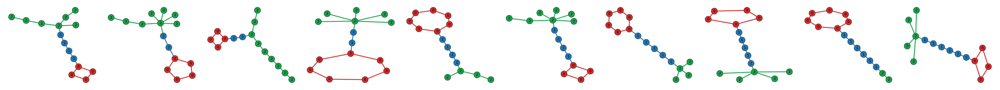

decoded from node encs | graph classes: unlabeled | node labels: decoded


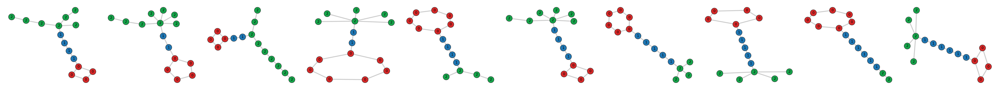

generated from graph encs, steps=75 | graph classes: unlabeled | node labels: generated, steps=75


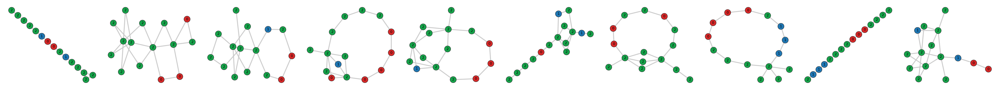

generated from graph encs, steps=100 | graph classes: unlabeled | node labels: generated, steps=100


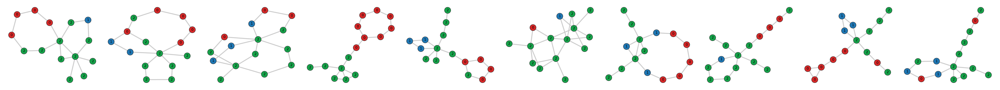

generated from graph encs, steps=300 | graph classes: unlabeled | node labels: generated, steps=300


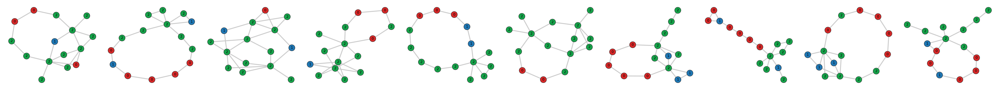

generated from graph encs, steps=500 | graph classes: unlabeled | node labels: generated, steps=500


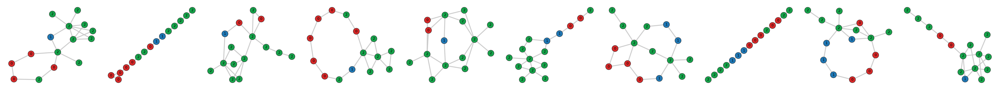

In [ ]:
# =============== MAIN ===============
print("true graphs")
import random
import numpy as np

steps_to_show = [75,100,300,500]   # keep one generated row; add more if you want
n_graphs_per_line = 10

probe_train_graphs, probe_train_targets, probe_info = sample_graphs_for_display(
    train_graphs,
    train_targets if "train_targets" in globals() else None,
    binary_n_per_class=5,
    multiclass_n_per_class=3,
    unlabeled_n=10,
)

print(f"display case: {probe_info['graph_case']} | node labels: {probe_info['node_case']}")

node_encs_list, conditioning_encs = decompositional_encoder_decoder.encode(probe_train_graphs)

decoded_graphs = decompositional_encoder_decoder.node_embeddings_to_graph_generator.decode(
    node_encs_list
)

conditioning_decoded_by_steps = {}
_original_total_steps = conditional_node_generator_model.total_steps

for steps in steps_to_show:
    conditional_node_generator_model.total_steps = steps
    conditioning_decoded_by_steps[steps] = decompositional_encoder_decoder.decode(conditioning_encs)

conditional_node_generator_model.total_steps = _original_total_steps

# Shared label map across all rows.
all_graphs = []
all_graphs.extend(probe_train_graphs)
all_graphs.extend(decoded_graphs)
for steps in steps_to_show:
    all_graphs.extend(conditioning_decoded_by_steps[steps])

_, label_to_idx = normalize_display_labels(all_graphs, label_to_idx=None)

probe_train_graphs, _ = normalize_display_labels(probe_train_graphs, label_to_idx=label_to_idx)
decoded_graphs, _ = normalize_display_labels(decoded_graphs, label_to_idx=label_to_idx)

for steps in steps_to_show:
    conditioning_decoded_by_steps[steps], _ = normalize_display_labels(
        conditioning_decoded_by_steps[steps],
        label_to_idx=label_to_idx,
    )


def _order_graphs_one_line(graphs, targets):
    """
    Binary: keeps classes grouped on one line, e.g. 5 pos then 5 neg.
    Multiclass: groups each class in order.
    Unlabeled: original order.
    """
    info = infer_display_case(graphs, targets)
    normalized_targets = info["targets"]
    classes = info["classes"]

    if normalized_targets is None or len(classes) == 0:
        return list(graphs), info

    ordered = []
    for cls in classes:
        ordered.extend([
            g for g, t in zip(graphs, normalized_targets)
            if t == cls
        ])

    return ordered, info


def _plot_stage_one_line(graphs, targets, title, node_label_source):
    ordered_graphs, info = _order_graphs_one_line(graphs, targets)
    classes = info["classes"]

    if len(classes) == 0:
        print(f"{title} | graph classes: unlabeled | node labels: {node_label_source}")
    else:
        counts = {
            cls: sum(t == cls for t in info["targets"])
            for cls in classes
        }
        print(f"{title} | graph classes: {counts} | node labels: {node_label_source}")

    plot_networkx_graphs(
        ordered_graphs,
        n_cols=len(ordered_graphs),
        node_label_attr="label",
        edge_label_attr="label",
        node_size=210,
        edge_width=2.2,
        layout="kamada_kawai",
    )


_plot_stage_one_line(
    probe_train_graphs,
    probe_train_targets,
    "true graphs",
    "true",
)

_plot_stage_one_line(
    decoded_graphs,
    probe_train_targets,
    "decoded from node encs",
    "decoded",
)

for steps in steps_to_show:
    _plot_stage_one_line(
        conditioning_decoded_by_steps[steps],
        probe_train_targets,
        f"generated from graph encs, steps={steps}",
        f"generated, steps={steps}",
    )


true graphs
display case: unlabeled | node labels: labeled
Node encoding 10 graphs


Class 'DecompositionalEncoderDecoder', Function 'node_encode' executed in 0.96 seconds (0.02 minutes, 0.00 hours).
Encoding 10 graphs
Class 'DecompositionalEncoderDecoder', Function 'graph_encode' executed in 0.92 seconds (0.02 minutes, 0.00 hours).
Predicting edge probabilities for 10 decoded graphs...
Class 'ConditionalNodeGeneratorModel', Function 'predict_edge_probabilities' executed in 0.50 seconds (0.01 minutes, 0.00 hours).
Predicting edge labels for 10 decoded graphs...
Class 'ConditionalNodeGeneratorModel', Function 'predict_edge_labels' executed in 0.00 seconds (0.00 minutes, 0.00 hours).
Class 'DecompositionalNodeEncoderDecoder', Function 'decode' executed in 0.83 seconds (0.01 minutes, 0.00 hours).
Decoding 10 conditioning vectors
Predicting node matrices for 10 graphs...
Predicting node matrices for 10 graphs...
Applied head-based projection for existence, degree, label channels.
Class 'ConditionalNodeGeneratorModel', Function 'predict' executed in 1.01 seconds (0.02 minut

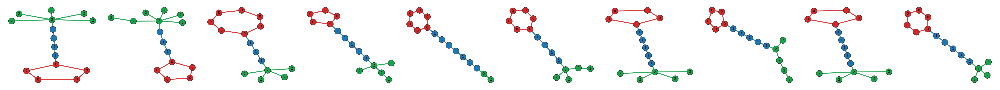

decode starting from true node encodings | graph classes: unlabeled | node labels: model-predicted labels


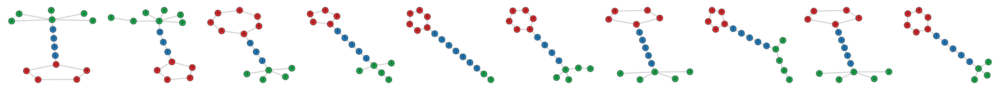

decode starting from true graph encodings | graph classes: unlabeled | node labels: generator path


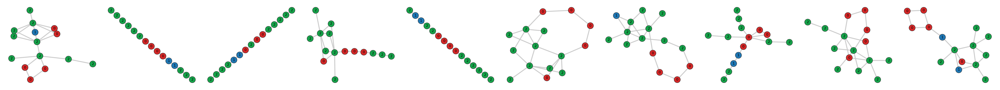

WL  (true vs nodes): {'wl_mmd': 0.0, 'wl_mmd2': -0.06512875611757352, 'wl_n_iter': 5}
WL  (true vs cond) : {'wl_mmd': 0.67126927015997, 'wl_mmd2': 0.4506024330610987, 'wl_n_iter': 5}
NSPDK (true vs nodes): {'nspdk_mmd': 0.0, 'nspdk_mmd2': -0.07757596608918171, 'nspdk_r': 1, 'nspdk_d': 4}
NSPDK (true vs cond) : {'nspdk_mmd': 0.6543766488866642, 'nspdk_mmd2': 0.42820879860814065, 'nspdk_r': 1, 'nspdk_d': 4}


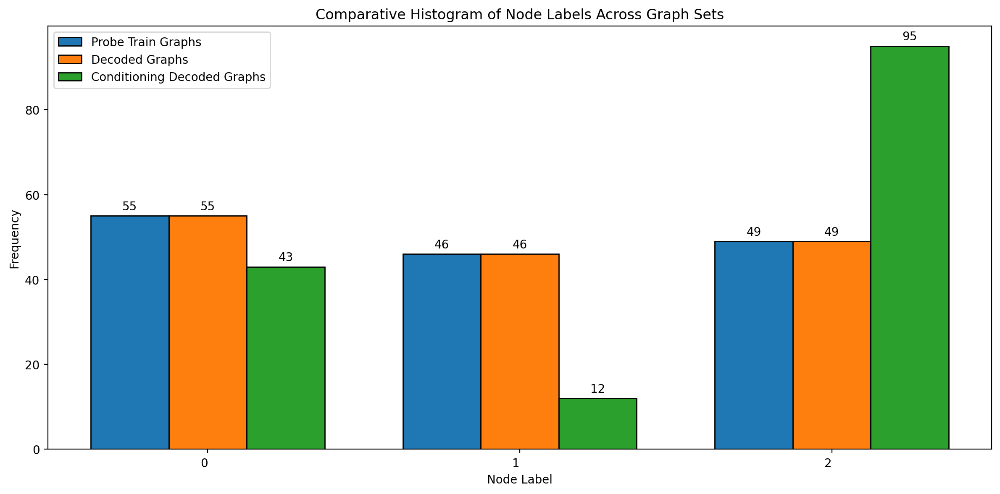

Edge-label dist  | true : Counter({0: 55, 2: 49, 1: 46})
Edge-label dist  | nodes: Counter({None: 150})
Edge-label dist  | cond : Counter({None: 171})


In [ ]:
decompositional_encoder_decoder.conditioning_to_node_embeddings_generator.conditional_node_generator.total_steps = 100

# =============== MAIN ===============
print("true graphs")
import random
import numpy as np
from collections import Counter

n_graphs_per_line = 10

probe_train_graphs, probe_train_targets, probe_info = sample_graphs_for_display(
    train_graphs,
    train_targets if "train_targets" in globals() else None,
    binary_n_per_class=5,
    multiclass_n_per_class=3,
    unlabeled_n=10,
)

print(f"display case: {probe_info['graph_case']} | node labels: {probe_info['node_case']}")

# Encodings + conditioning vectors
node_encs_list, conditioning_encs = decompositional_encoder_decoder.encode(probe_train_graphs)

# Decode from TRUE node encodings.
decoded_graphs = decompositional_encoder_decoder.node_embeddings_to_graph_generator.decode(
    node_encs_list
)

# Decode from CONDITIONING / generator path.
conditioning_decoded_graphs = decompositional_encoder_decoder.decode(
    conditioning_encs
)

# Shared node-display label map across all rows.
all_graphs = probe_train_graphs + decoded_graphs + conditioning_decoded_graphs

_, label_to_idx = normalize_display_labels(all_graphs, label_to_idx=None)

probe_train_graphs, _ = normalize_display_labels(
    probe_train_graphs,
    label_to_idx=label_to_idx,
)

decoded_graphs, _ = normalize_display_labels(
    decoded_graphs,
    label_to_idx=label_to_idx,
)

conditioning_decoded_graphs, _ = normalize_display_labels(
    conditioning_decoded_graphs,
    label_to_idx=label_to_idx,
)


def _order_graphs_same_line(graphs, targets):
    """
    Groups graphs by target class on the same visual line.
    Binary example: 5 positives followed by 5 negatives.
    """
    info = infer_display_case(graphs, targets)
    normalized_targets = info["targets"]
    classes = info["classes"]

    if normalized_targets is None or len(classes) == 0:
        return list(graphs), info

    ordered = []
    for cls in classes:
        ordered.extend([
            g for g, t in zip(graphs, normalized_targets)
            if t == cls
        ])

    return ordered, info


def plot_stage_same_line(graphs, targets, title, node_label_source):
    ordered_graphs, info = _order_graphs_same_line(graphs, targets)

    if info["targets"] is None or len(info["classes"]) == 0:
        print(f"{title} | graph classes: unlabeled | node labels: {node_label_source}")
    else:
        counts = Counter(info["targets"])
        print(f"{title} | graph classes: {dict(counts)} | node labels: {node_label_source}")

    plot_networkx_graphs(
        ordered_graphs,
        n_cols=min(n_graphs_per_line, len(ordered_graphs)),
        node_label_attr="label",
        edge_label_attr="label",
        node_size=210,
        edge_width=2.2,
        layout="kamada_kawai",
    )


plot_stage_same_line(
    probe_train_graphs,
    probe_train_targets,
    title="true graphs",
    node_label_source="true",
)

plot_stage_same_line(
    decoded_graphs,
    probe_train_targets,
    title="decode starting from true node encodings",
    node_label_source="model-predicted labels",
)

plot_stage_same_line(
    conditioning_decoded_graphs,
    probe_train_targets,
    title="decode starting from true graph encodings",
    node_label_source="generator path",
)


# ---------------- metrics ----------------
wl_true_vs_nodes = wl_mmd(probe_train_graphs, decoded_graphs, n_iter=5, normalize=True)
wl_true_vs_cond  = wl_mmd(probe_train_graphs, conditioning_decoded_graphs, n_iter=5, normalize=True)
ns_true_vs_nodes = nspdk_mmd(probe_train_graphs, decoded_graphs, r=1, d=4, normalize=True)
ns_true_vs_cond  = nspdk_mmd(probe_train_graphs, conditioning_decoded_graphs, r=1, d=4, normalize=True)

print("WL  (true vs nodes):", wl_true_vs_nodes)
print("WL  (true vs cond) :", wl_true_vs_cond)
print("NSPDK (true vs nodes):", ns_true_vs_nodes)
print("NSPDK (true vs cond) :", ns_true_vs_cond)

plot_label_comparative_histogram(
    probe_train_graphs,
    decoded_graphs,
    conditioning_decoded_graphs,
)

# -------- optional: quick sanity on EDGE labels --------
def edge_label_hist(graphs):
    c = Counter()
    for G in graphs:
        for _, _, d in G.edges(data=True):
            if "label" in d:
                c[d["label"]] += 1
    return c

print("Edge-label dist  | true :", edge_label_hist(probe_train_graphs))
print("Edge-label dist  | nodes:", edge_label_hist(decoded_graphs))
print("Edge-label dist  | cond :", edge_label_hist(conditioning_decoded_graphs))


true graphs
display case: unlabeled | node labels: labeled
Node encoding 10 graphs
Class 'DecompositionalEncoderDecoder', Function 'node_encode' executed in 0.89 seconds (0.01 minutes, 0.00 hours).
Encoding 10 graphs


Class 'DecompositionalEncoderDecoder', Function 'graph_encode' executed in 0.94 seconds (0.02 minutes, 0.00 hours).
Predicting edge probabilities for 10 decoded graphs...
Class 'ConditionalNodeGeneratorModel', Function 'predict_edge_probabilities' executed in 0.50 seconds (0.01 minutes, 0.00 hours).
Predicting edge labels for 10 decoded graphs...
Class 'ConditionalNodeGeneratorModel', Function 'predict_edge_labels' executed in 0.00 seconds (0.00 minutes, 0.00 hours).
Class 'DecompositionalNodeEncoderDecoder', Function 'decode' executed in 0.84 seconds (0.01 minutes, 0.00 hours).
Decoding 10 conditioning vectors
Predicting node matrices for 10 graphs...
Predicting node matrices for 10 graphs...
Applied head-based projection for existence, degree, label channels.
Class 'ConditionalNodeGeneratorModel', Function 'predict' executed in 2.58 seconds (0.04 minutes, 0.00 hours).
Predicting edge probabilities for 10 decoded graphs...
Class 'ConditionalNodeGeneratorModel', Function 'predict_edge_

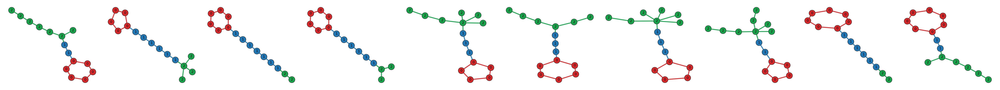

decode starting from true node encodings | graph classes: unlabeled | node labels: model-predicted labels


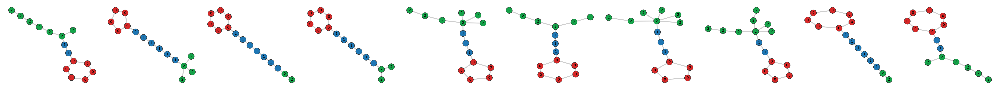

decode starting from true graph encodings | graph classes: unlabeled | node labels: generator path


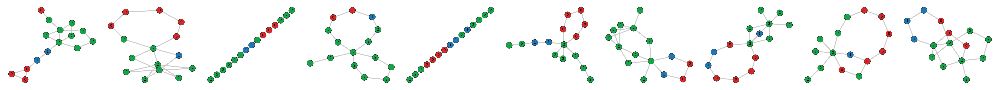

WL  (true vs nodes): {'wl_mmd': 0.0, 'wl_mmd2': -0.07068676822436126, 'wl_n_iter': 5}
WL  (true vs cond) : {'wl_mmd': 0.5719071018928591, 'wl_mmd2': 0.32707773319548905, 'wl_n_iter': 5}
NSPDK (true vs nodes): {'nspdk_mmd': 0.0, 'nspdk_mmd2': -0.10052303149624442, 'nspdk_r': 1, 'nspdk_d': 4}
NSPDK (true vs cond) : {'nspdk_mmd': 0.4660957159146391, 'nspdk_mmd2': 0.21724521639397998, 'nspdk_r': 1, 'nspdk_d': 4}


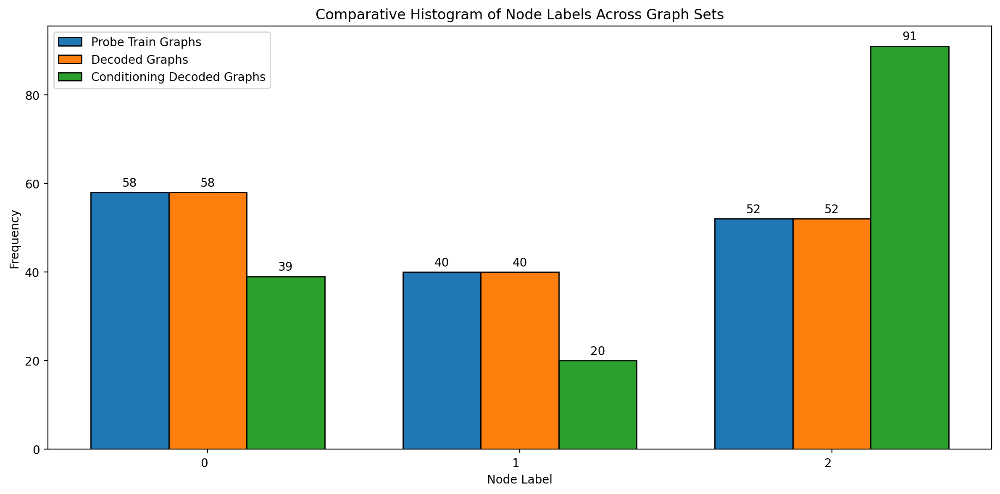

Edge-label dist  | true : Counter({0: 58, 2: 52, 1: 40})
Edge-label dist  | nodes: Counter({None: 150})
Edge-label dist  | cond : Counter({None: 169})


In [ ]:
decompositional_encoder_decoder.conditioning_to_node_embeddings_generator.conditional_node_generator.total_steps = 300

# =============== MAIN ===============
print("true graphs")
import random
import numpy as np
from collections import Counter

n_graphs_per_line = 10

probe_train_graphs, probe_train_targets, probe_info = sample_graphs_for_display(
    train_graphs,
    train_targets if "train_targets" in globals() else None,
    binary_n_per_class=5,
    multiclass_n_per_class=3,
    unlabeled_n=10,
)

print(f"display case: {probe_info['graph_case']} | node labels: {probe_info['node_case']}")

# Encodings + conditioning vectors
node_encs_list, conditioning_encs = decompositional_encoder_decoder.encode(probe_train_graphs)

# Decode from TRUE node encodings.
decoded_graphs = decompositional_encoder_decoder.node_embeddings_to_graph_generator.decode(
    node_encs_list
)

# Decode from CONDITIONING / generator path.
conditioning_decoded_graphs = decompositional_encoder_decoder.decode(
    conditioning_encs
)

# Shared node-display label map across all rows.
all_graphs = probe_train_graphs + decoded_graphs + conditioning_decoded_graphs

_, label_to_idx = normalize_display_labels(all_graphs, label_to_idx=None)

probe_train_graphs, _ = normalize_display_labels(
    probe_train_graphs,
    label_to_idx=label_to_idx,
)

decoded_graphs, _ = normalize_display_labels(
    decoded_graphs,
    label_to_idx=label_to_idx,
)

conditioning_decoded_graphs, _ = normalize_display_labels(
    conditioning_decoded_graphs,
    label_to_idx=label_to_idx,
)


def _order_graphs_same_line(graphs, targets):
    """
    Groups graphs by target class on the same visual line.
    Binary example: 5 positives followed by 5 negatives.
    """
    info = infer_display_case(graphs, targets)
    normalized_targets = info["targets"]
    classes = info["classes"]

    if normalized_targets is None or len(classes) == 0:
        return list(graphs), info

    ordered = []
    for cls in classes:
        ordered.extend([
            g for g, t in zip(graphs, normalized_targets)
            if t == cls
        ])

    return ordered, info


def plot_stage_same_line(graphs, targets, title, node_label_source):
    ordered_graphs, info = _order_graphs_same_line(graphs, targets)

    if info["targets"] is None or len(info["classes"]) == 0:
        print(f"{title} | graph classes: unlabeled | node labels: {node_label_source}")
    else:
        counts = Counter(info["targets"])
        print(f"{title} | graph classes: {dict(counts)} | node labels: {node_label_source}")

    plot_networkx_graphs(
        ordered_graphs,
        n_cols=min(n_graphs_per_line, len(ordered_graphs)),
        node_label_attr="label",
        edge_label_attr="label",
        node_size=210,
        edge_width=2.2,
        layout="kamada_kawai",
    )


plot_stage_same_line(
    probe_train_graphs,
    probe_train_targets,
    title="true graphs",
    node_label_source="true",
)

plot_stage_same_line(
    decoded_graphs,
    probe_train_targets,
    title="decode starting from true node encodings",
    node_label_source="model-predicted labels",
)

plot_stage_same_line(
    conditioning_decoded_graphs,
    probe_train_targets,
    title="decode starting from true graph encodings",
    node_label_source="generator path",
)


# ---------------- metrics ----------------
wl_true_vs_nodes = wl_mmd(probe_train_graphs, decoded_graphs, n_iter=5, normalize=True)
wl_true_vs_cond  = wl_mmd(probe_train_graphs, conditioning_decoded_graphs, n_iter=5, normalize=True)
ns_true_vs_nodes = nspdk_mmd(probe_train_graphs, decoded_graphs, r=1, d=4, normalize=True)
ns_true_vs_cond  = nspdk_mmd(probe_train_graphs, conditioning_decoded_graphs, r=1, d=4, normalize=True)

print("WL  (true vs nodes):", wl_true_vs_nodes)
print("WL  (true vs cond) :", wl_true_vs_cond)
print("NSPDK (true vs nodes):", ns_true_vs_nodes)
print("NSPDK (true vs cond) :", ns_true_vs_cond)

plot_label_comparative_histogram(
    probe_train_graphs,
    decoded_graphs,
    conditioning_decoded_graphs,
)

# -------- optional: quick sanity on EDGE labels --------
def edge_label_hist(graphs):
    c = Counter()
    for G in graphs:
        for _, _, d in G.edges(data=True):
            if "label" in d:
                c[d["label"]] += 1
    return c

print("Edge-label dist  | true :", edge_label_hist(probe_train_graphs))
print("Edge-label dist  | nodes:", edge_label_hist(decoded_graphs))
print("Edge-label dist  | cond :", edge_label_hist(conditioning_decoded_graphs))


true graphs
display case: unlabeled | node labels: labeled
Node encoding 9 graphs


Class 'DecompositionalEncoderDecoder', Function 'node_encode' executed in 0.94 seconds (0.02 minutes, 0.00 hours).
Encoding 9 graphs
Class 'DecompositionalEncoderDecoder', Function 'graph_encode' executed in 0.92 seconds (0.02 minutes, 0.00 hours).
decode starting from the true node encodings with noise
---------------------------------------------------------------------------------------------------- eps:0.000
Predicting edge probabilities for 9 decoded graphs...
Class 'ConditionalNodeGeneratorModel', Function 'predict_edge_probabilities' executed in 0.45 seconds (0.01 minutes, 0.00 hours).
Predicting edge labels for 9 decoded graphs...
Class 'ConditionalNodeGeneratorModel', Function 'predict_edge_labels' executed in 0.00 seconds (0.00 minutes, 0.00 hours).
Class 'DecompositionalNodeEncoderDecoder', Function 'decode' executed in 0.79 seconds (0.01 minutes, 0.00 hours).
---------------------------------------------------------------------------------------------------- eps:0.233
Predi

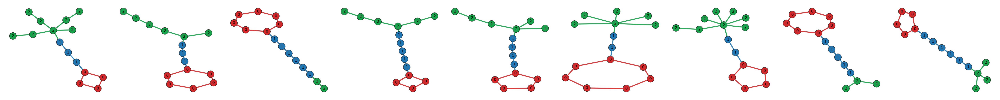

decoded with noise eps=0.000 | graph classes: unlabeled | node labels: model-predicted node labels


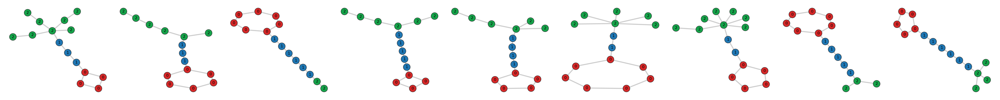

decoded with noise eps=0.233 | graph classes: unlabeled | node labels: model-predicted node labels


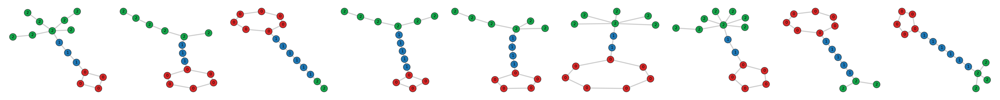

decoded with noise eps=0.467 | graph classes: unlabeled | node labels: model-predicted node labels


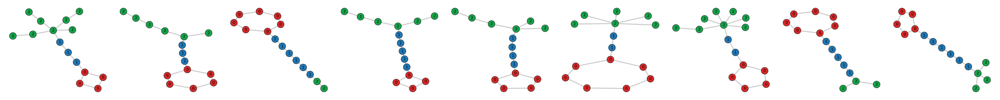

decoded with noise eps=0.700 | graph classes: unlabeled | node labels: model-predicted node labels


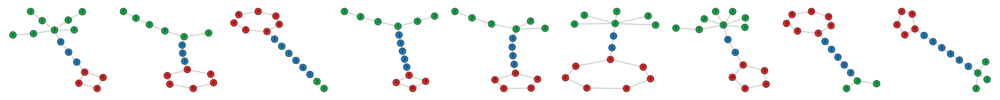

In [ ]:
print("true graphs")

def summarize_node_labels(graphs, name="graphs"):
    print(name)
    for i, g in enumerate(graphs):
        labels = sorted({g.nodes[u].get("label", None) for u in g.nodes()})
        print(f"  graph {i}: {len(labels)} unique node labels -> {labels}")


import random
import numpy as np
from collections import Counter

n_graphs_per_line = 10
eps_values = np.linspace(0.0, 0.7, 4)

probe_train_graphs, probe_train_targets, probe_info = sample_graphs_for_display(
    train_graphs,
    train_targets if "train_targets" in globals() else None,
    binary_n_per_class=5,
    multiclass_n_per_class=3,
    unlabeled_n=9,
)

print(f"display case: {probe_info['graph_case']} | node labels: {probe_info['node_case']}")

# Encode once
node_encs_list, conditioning_encs = decompositional_encoder_decoder.encode(probe_train_graphs)

decoded_by_eps = {}

print("decode starting from the true node encodings with noise")

for eps in eps_values:
    eps = float(eps)
    print("-" * 100, f"eps:{eps:.3f}")

    perturbed = []

    for enc in node_encs_list:
        E = enc.copy()
        N, D = E.shape

        noise = np.random.rand(N, D) * eps
        # Reconstruction diagnostic: keep semantic columns exact.
        # Cols: 0=node exists, 1=degree, 2=node label.
        noise[:, :3] = 0.0
        perturbed.append((E + noise).astype(float, copy=False))

    decoded = decompositional_encoder_decoder.node_embeddings_to_graph_generator.decode(
        perturbed
    )
    decoded_by_eps[eps] = decoded


# Shared label map across true + all noisy decodes.
all_graphs = list(probe_train_graphs)

for eps in sorted(decoded_by_eps):
    all_graphs.extend(decoded_by_eps[eps])

_, label_to_idx = normalize_display_labels(all_graphs, label_to_idx=None)

probe_train_graphs, _ = normalize_display_labels(
    probe_train_graphs,
    label_to_idx=label_to_idx,
)

for eps in sorted(decoded_by_eps):
    decoded_by_eps[eps], _ = normalize_display_labels(
        decoded_by_eps[eps],
        label_to_idx=label_to_idx,
    )


def _order_graphs_same_line(graphs, targets):
    info = infer_display_case(graphs, targets)
    normalized_targets = info["targets"]
    classes = info["classes"]

    if normalized_targets is None or len(classes) == 0:
        return list(graphs), info

    ordered = []
    for cls in classes:
        ordered.extend([
            g for g, t in zip(graphs, normalized_targets)
            if t == cls
        ])

    return ordered, info


def plot_stage_same_line(graphs, targets, title, node_label_source):
    ordered_graphs, info = _order_graphs_same_line(graphs, targets)

    if info["targets"] is None or len(info["classes"]) == 0:
        print(f"{title} | graph classes: unlabeled | node labels: {node_label_source}")
    else:
        counts = Counter(info["targets"])
        print(f"{title} | graph classes: {dict(counts)} | node labels: {node_label_source}")

    plot_networkx_graphs(
        ordered_graphs,
        n_cols=min(n_graphs_per_line, len(ordered_graphs)),
        node_label_attr="label",
        edge_label_attr="label",
        node_size=210,
        edge_width=2.2,
        layout="kamada_kawai",
    )


plot_stage_same_line(
    probe_train_graphs,
    probe_train_targets,
    title="true graphs",
    node_label_source="true",
)

for eps in sorted(decoded_by_eps):
    plot_stage_same_line(
        decoded_by_eps[eps],
        probe_train_targets,
        title=f"decoded with noise eps={eps:.3f}",
        node_label_source="model-predicted node labels",
    )


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from typing import Optional

def compare_degree_histograms(
        true_encodings_list,
        pred_encodings_list,
        title: str = "Degree distribution (true vs. predicted)",
        ax: Optional[plt.Axes] = None,
        true_label: str = "True",
        pred_label: str = "Predicted",
        true_color: str = "tab:blue",
        pred_color: str = "tab:orange",
        alpha: float = 0.6,
        exist_threshold: float = 0.5,
    ):
    """
    Plot overlaid histograms of node degrees (column 1) for true and predicted encodings,
    *excluding* rows where existence flag (column 0) < `exist_threshold`.

    Parameters
    ----------
    true_encodings_list, pred_encodings_list : list[np.ndarray]
        Lists of (N_i, D) arrays in raw (un-scaled) space.
    exist_threshold : float
        Rows with existence flag below this value are ignored.
    """

    def extract_valid_degrees(enc_list):
        degs = []
        for m in enc_list:
            mask = m[:, 0] >= exist_threshold    # keep only existent nodes
            if mask.any():
                degs.append(m[mask, 1])
        if not degs:
            return np.array([], dtype=int)
        return np.concatenate(degs)

    # 1. gather degrees
    true_deg = extract_valid_degrees(true_encodings_list).round().astype(int)
    pred_deg = extract_valid_degrees(pred_encodings_list).round().astype(int)

    if true_deg.size == 0 and pred_deg.size == 0:
        raise ValueError("No nodes passed the existence threshold in either list.")

    # 2. integer-aligned bin edges
    max_k = int(max(true_deg.max(initial=0), pred_deg.max(initial=0)))
    bins  = np.arange(-0.5, max_k + 1.5, 1)     # one bin per integer

    if ax is None:
        fig, ax = plt.subplots(figsize=(8, 4))

    # 3. plot histograms
    if true_deg.size:
        ax.hist(true_deg, bins=bins, alpha=alpha,
                color=true_color, label=true_label, edgecolor="k")
    if pred_deg.size:
        ax.hist(pred_deg, bins=bins, alpha=alpha,
                color=pred_color, label=pred_label, edgecolor="k")

    # 4. cosmetics
    ax.set_xticks(np.arange(0, max_k + 1))
    ax.set_xlabel("Degree")
    ax.set_ylabel("Count")
    ax.set_title(title)
    ax.legend()
    ax.grid(axis="y", linestyle="--", alpha=0.3)

    return ax


Node encoding 40 graphs


Class 'DecompositionalEncoderDecoder', Function 'node_encode' executed in 1.46 seconds (0.02 minutes, 0.00 hours).
Encoding 40 graphs
Class 'DecompositionalEncoderDecoder', Function 'graph_encode' executed in 0.42 seconds (0.01 minutes, 0.00 hours).
Predicting node matrices for 40 graphs...
Predicting node matrices for 40 graphs...
Applied head-based projection for existence, degree, label channels.
Class 'ConditionalNodeGeneratorModel', Function 'predict' executed in 2.57 seconds (0.04 minutes, 0.00 hours).
=== shape debug ===
conditioning C dim: (16384,)
true node X shape: (15, 16385)
pred node X shape: (15, 16385)
finite node-X correlations: 40 / 40


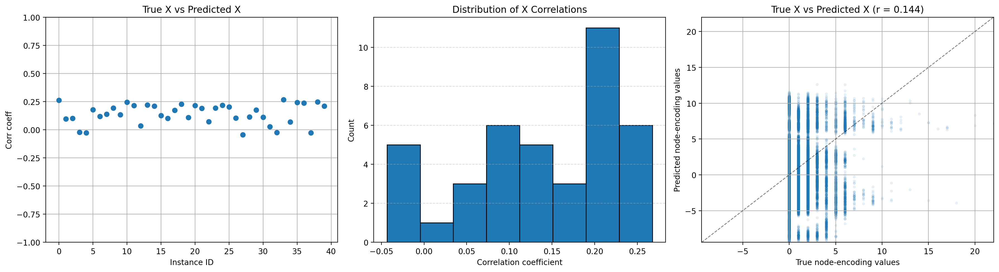

=== node-encoding reconstruction stats ===
n graphs used: 40
median r: 0.156 | mean r: 0.141 | overall r: 0.144

=== node-count stats ===
true node count: mean=15.00, min=15, max=15
pred node count: mean=15.00, min=15, max=15
node count abs error: mean=0.00

=== degree stats ===
true degree hist: {5: 7, 1: 118, 2: 407, 3: 53, 4: 8, 6: 7}
pred degree hist: {6: 36, 2: 413, 1: 106, 5: 43, 3: 2}


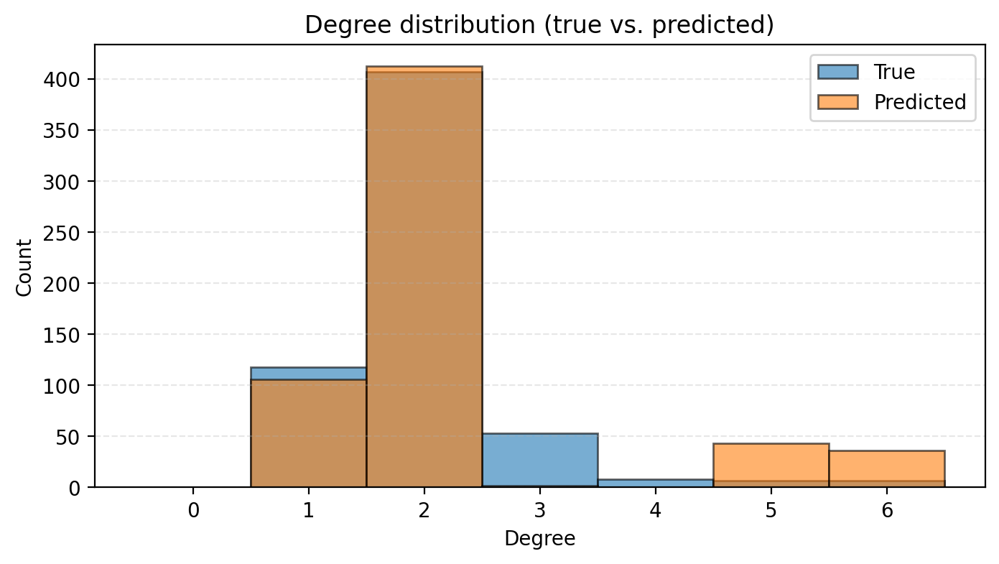

Predicting edge probabilities for 40 decoded graphs...
Class 'ConditionalNodeGeneratorModel', Function 'predict_edge_probabilities' executed in 0.07 seconds (0.00 minutes, 0.00 hours).
Predicting edge labels for 40 decoded graphs...
Class 'ConditionalNodeGeneratorModel', Function 'predict_edge_labels' executed in 0.00 seconds (0.00 minutes, 0.00 hours).
Class 'DecompositionalNodeEncoderDecoder', Function 'decode' executed in 185.19 seconds (3.09 minutes, 0.05 hours).

=== graph motif stats: true probe graphs ===
nodes    : {15: 40}
edges    : {15: 40}
degrees  : {5: 7, 1: 118, 2: 407, 3: 53, 4: 8, 6: 7}
triangles: {0: 40}
cycles   : {1: 40}

=== graph motif stats: decoded predicted X graphs ===
nodes    : {15: 40}
edges    : {25: 1, 23: 1, 16: 13, 19: 3, 21: 3, 17: 5, 20: 2, 18: 5, 15: 5, 14: 2}
degrees  : {6: 36, 2: 406, 1: 100, 5: 43, 3: 15}
triangles: {6: 2, 0: 18, 2: 4, 1: 12, 3: 4}
cycles   : {11: 1, 9: 1, 2: 13, 5: 3, 7: 3, 3: 5, 6: 2, 4: 5, 1: 5, 0: 2}

=== paired exact graph-st

0.125

In [ ]:
import random
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter

random.seed(0)

n = min(40, len(train_graphs))
probe_train_graphs = random.sample(train_graphs, n)

node_encs, conditioning_encodings = decompositional_encoder_decoder.encode(probe_train_graphs)

predicted_node_encodings_list = (
    decompositional_encoder_decoder
    .conditioning_to_node_embeddings_generator
    .predict(conditioning_encodings)
)


def safe_corr(x, y):
    x = np.asarray(x, dtype=float).ravel()
    y = np.asarray(y, dtype=float).ravel()

    m = min(x.size, y.size)
    x = x[:m]
    y = y[:m]

    if m == 0:
        return np.nan
    if np.std(x) == 0 or np.std(y) == 0:
        return np.nan

    return float(np.corrcoef(x, y)[0, 1])


def align_node_matrices(true_enc, pred_enc):
    A = np.asarray(true_enc, dtype=float)
    B = np.asarray(pred_enc, dtype=float)

    n_rows = min(A.shape[0], B.shape[0])
    n_cols = min(A.shape[1], B.shape[1])

    return A[:n_rows, :n_cols], B[:n_rows, :n_cols]


def degree_vector(enc, existence_threshold=0.5):
    enc = np.asarray(enc, dtype=float)
    if enc.ndim != 2 or enc.shape[1] < 2:
        return np.array([], dtype=int)

    mask = enc[:, 0] > existence_threshold
    return np.rint(enc[mask, 1]).astype(int)


def presence_count(enc, existence_threshold=0.5):
    enc = np.asarray(enc, dtype=float)
    if enc.ndim != 2 or enc.shape[1] < 1:
        return 0

    return int((enc[:, 0] > existence_threshold).sum())


# ---------------- Correlations: true X vs predicted X ----------------
ccs = []
true_flat_all = []
pred_flat_all = []

for true_nodes, pred_nodes in zip(node_encs, predicted_node_encodings_list):
    A, B = align_node_matrices(true_nodes, pred_nodes)

    ccs.append(safe_corr(A, B))
    true_flat_all.append(A.ravel())
    pred_flat_all.append(B.ravel())

data_real = np.concatenate(true_flat_all) if true_flat_all else np.array([])
data_pred = np.concatenate(pred_flat_all) if pred_flat_all else np.array([])
overall_corr = safe_corr(data_real, data_pred)

finite_ccs = [c for c in ccs if np.isfinite(c)]

print("=== shape debug ===")
print("conditioning C dim:", np.asarray(conditioning_encodings[0]).shape)
print("true node X shape:", np.asarray(node_encs[0]).shape)
print("pred node X shape:", np.asarray(predicted_node_encodings_list[0]).shape)
print("finite node-X correlations:", len(finite_ccs), "/", len(ccs))

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5))

ax1.plot(ccs, "o")
ax1.set_ylim(-1, 1)
ax1.set_xlabel("Instance ID")
ax1.set_ylabel("Corr coeff")
ax1.set_title("True X vs Predicted X")
ax1.grid(True)

if finite_ccs:
    ax2.hist(finite_ccs, bins=8, edgecolor="black")
else:
    ax2.text(0.5, 0.5, "No finite values", ha="center", va="center")

ax2.set_xlabel("Correlation coefficient")
ax2.set_ylabel("Count")
ax2.set_title("Distribution of X Correlations")
ax2.grid(axis="y", linestyle="--", alpha=0.5)

if data_pred.size and data_real.size:
    min_val = float(min(data_real.min(), data_pred.min()))
    max_val = float(max(data_real.max(), data_pred.max()))
    if min_val == max_val:
        min_val -= 1
        max_val += 1

    lims = [min_val, max_val]
    ax3.scatter(data_real, data_pred, alpha=0.08, s=8)
    ax3.plot(lims, lims, "k--", linewidth=1, alpha=0.5)
    ax3.set_xlim(lims)
    ax3.set_ylim(lims)
else:
    ax3.text(0.5, 0.5, "No values", ha="center", va="center")

ax3.set_xlabel("True node-encoding values")
ax3.set_ylabel("Predicted node-encoding values")
ax3.set_title(f"True X vs Predicted X (r = {overall_corr:.3f})")
ax3.grid(True)

plt.tight_layout()
plt.show()


# ---------------- Summary stats ----------------
median_r = np.nanmedian(ccs) if finite_ccs else np.nan
mean_r = np.nanmean(ccs) if finite_ccs else np.nan

true_node_counts = [presence_count(enc) for enc in node_encs]
pred_node_counts = [presence_count(enc) for enc in predicted_node_encodings_list]

true_degrees = [degree_vector(enc) for enc in node_encs]
pred_degrees = [degree_vector(enc) for enc in predicted_node_encodings_list]

true_degree_flat = np.concatenate(true_degrees) if true_degrees else np.array([], dtype=int)
pred_degree_flat = np.concatenate(pred_degrees) if pred_degrees else np.array([], dtype=int)

print("=== node-encoding reconstruction stats ===")
print(f"n graphs used: {n}")
print(f"median r: {median_r:.3f} | mean r: {mean_r:.3f} | overall r: {overall_corr:.3f}")

print()
print("=== node-count stats ===")
print(f"true node count: mean={np.mean(true_node_counts):.2f}, min={np.min(true_node_counts)}, max={np.max(true_node_counts)}")
print(f"pred node count: mean={np.mean(pred_node_counts):.2f}, min={np.min(pred_node_counts)}, max={np.max(pred_node_counts)}")
print(f"node count abs error: mean={np.mean(np.abs(np.array(true_node_counts) - np.array(pred_node_counts))):.2f}")

print()
print("=== degree stats ===")
print("true degree hist:", dict(Counter(true_degree_flat.tolist())))
print("pred degree hist:", dict(Counter(pred_degree_flat.tolist())))

if "compare_degree_histograms" in globals():
    compare_degree_histograms(node_encs, predicted_node_encodings_list)
    plt.show()
# ---------------- Graph/motif stats ----------------
import networkx as nx
from collections import Counter

def graph_motif_stats(graphs, name):
    node_counts = Counter(g.number_of_nodes() for g in graphs)
    edge_counts = Counter(g.number_of_edges() for g in graphs)
    degree_counts = Counter(d for g in graphs for _, d in g.degree())
    triangle_counts = Counter(sum(nx.triangles(g).values()) // 3 for g in graphs)
    cycle_counts = Counter(len(nx.cycle_basis(g)) for g in graphs)

    print()
    print(f"=== graph motif stats: {name} ===")
    print("nodes    :", dict(node_counts))
    print("edges    :", dict(edge_counts))
    print("degrees  :", dict(degree_counts))
    print("triangles:", dict(triangle_counts))
    print("cycles   :", dict(cycle_counts))

    return {
        "nodes": node_counts,
        "edges": edge_counts,
        "degrees": degree_counts,
        "triangles": triangle_counts,
        "cycles": cycle_counts,
    }


def exact_match_rate(true_graphs, pred_graphs, stat_fn, name):
    vals_true = [stat_fn(g) for g in true_graphs]
    vals_pred = [stat_fn(g) for g in pred_graphs]
    n_pair = min(len(vals_true), len(vals_pred))

    if n_pair == 0:
        print(f"{name}: no paired graphs")
        return np.nan

    rate = np.mean([
        vals_true[i] == vals_pred[i]
        for i in range(n_pair)
    ])

    print(f"{name}: {rate:.3f} ({int(rate * n_pair)}/{n_pair})")
    return rate


# Decode predicted node encodings into graphs.
decoded_pred_graphs = decompositional_encoder_decoder.node_embeddings_to_graph_generator.decode(
    predicted_node_encodings_list,
    conditional_graph_encodings=conditioning_encodings,
)

true_graph_stats = graph_motif_stats(probe_train_graphs, "true probe graphs")
pred_graph_stats = graph_motif_stats(decoded_pred_graphs, "decoded predicted X graphs")

print()
print("=== paired exact graph-stat match rates ===")
exact_match_rate(
    probe_train_graphs,
    decoded_pred_graphs,
    lambda g: g.number_of_nodes(),
    "node count",
)
exact_match_rate(
    probe_train_graphs,
    decoded_pred_graphs,
    lambda g: g.number_of_edges(),
    "edge count",
)
exact_match_rate(
    probe_train_graphs,
    decoded_pred_graphs,
    lambda g: tuple(sorted(dict(g.degree()).values())),
    "sorted degree sequence",
)
exact_match_rate(
    probe_train_graphs,
    decoded_pred_graphs,
    lambda g: sum(nx.triangles(g).values()) // 3,
    "triangle count",
)
exact_match_rate(
    probe_train_graphs,
    decoded_pred_graphs,
    lambda g: len(nx.cycle_basis(g)),
    "cycle count",
)


In [ ]:
import pickle
from pathlib import Path

SAVE_GENERATED_GRAPHS = False

# Options:
#   "manual"      -> use MANUAL_N_GENERATED
#   "train1"      -> len(train1_graphs)
#   "train_whole" -> len(train_whole_graphs)
#   "train"       -> len(train_graphs)
N_GENERATED_MODE = "train1" 
N_GENERATED_MODE = "MANUAL_N_GENERATED" 

MANUAL_N_GENERATED = 100

GENERATED_GRAPH_PATH = Path("generated_graphs.pkl")

if SAVE_GENERATED_GRAPHS:
    if N_GENERATED_MODE == "manual":
        n_generated = int(MANUAL_N_GENERATED)
    elif N_GENERATED_MODE == "train1":
        n_generated = len(train1_graphs)
    elif N_GENERATED_MODE == "train_whole":
        n_generated = len(train_whole_graphs)
    elif N_GENERATED_MODE == "train":
        n_generated = len(train_graphs)
    else:
        raise ValueError("N_GENERATED_MODE must be 'manual', 'train1', 'train_whole', or 'train'")

    print(f"generating {n_generated} graphs...")

    generated_graphs = decompositional_encoder_decoder.sample(n_samples=n_generated)

    payload = {
        "generated_graphs": generated_graphs,
        "n_generated": n_generated,
        "mode": N_GENERATED_MODE,
        "dataset_name": globals().get("dataset_name", None),
        "total_steps": getattr(conditional_node_generator_model, "total_steps", None),
        "use_label_offset": globals().get("use_label_offset", None),
    }

    with GENERATED_GRAPH_PATH.open("wb") as f:
        pickle.dump(payload, f)

    print(f"saved generated graphs to: {GENERATED_GRAPH_PATH.resolve()}")
else:
    print("SAVE_GENERATED_GRAPHS is False; skipped saving.")


SAVE_GENERATED_GRAPHS is False; skipped saving.


Sampling 45 graphs
Predicting node matrices for 45 graphs...
Predicting node matrices for 45 graphs...


Applied head-based projection for existence, degree, label channels.
Class 'ConditionalNodeGeneratorModel', Function 'predict' executed in 0.88 seconds (0.01 minutes, 0.00 hours).
Predicting edge probabilities for 45 decoded graphs...
Class 'ConditionalNodeGeneratorModel', Function 'predict_edge_probabilities' executed in 0.07 seconds (0.00 minutes, 0.00 hours).
Predicting edge labels for 45 decoded graphs...
Class 'ConditionalNodeGeneratorModel', Function 'predict_edge_labels' executed in 0.00 seconds (0.00 minutes, 0.00 hours).
Predicting edge labels for 45 decoded graphs...
Class 'ConditionalNodeGeneratorModel', Function 'predict_edge_labels' executed in 0.00 seconds (0.00 minutes, 0.00 hours).
Class 'DecompositionalNodeEncoderDecoder', Function 'decode' executed in 0.02 seconds (0.00 minutes, 0.00 hours).
Class 'DecompositionalEncoderDecoder', Function 'sample' executed in 125.13 seconds (2.09 minutes, 0.03 hours).


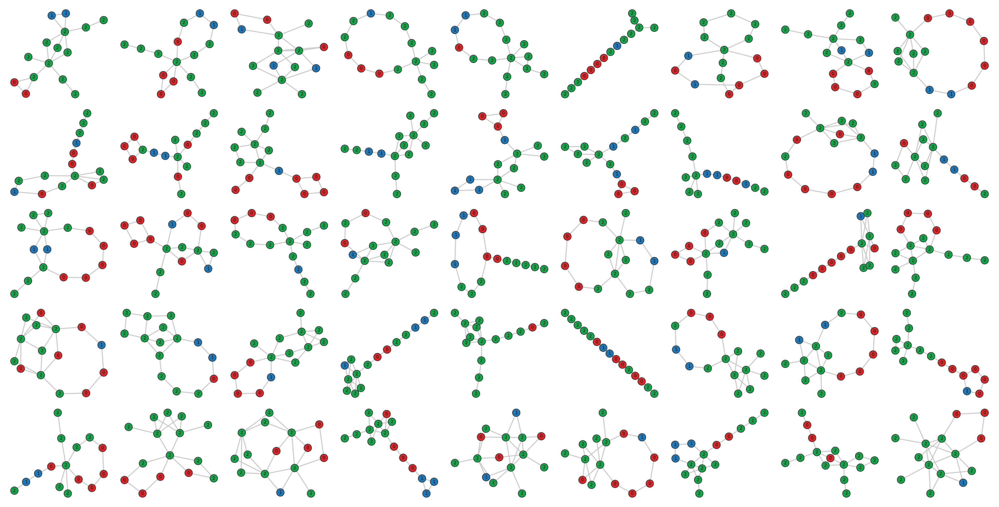

In [ ]:
decompositional_encoder_decoder.conditioning_to_node_embeddings_generator.conditional_node_generator.total_steps = 75

n_rows = 5
n_cols = 9
n_samples = n_rows * n_cols

sampled_graphs = decompositional_encoder_decoder.sample(n_samples=n_samples)

plot_networkx_graphs(
    sampled_graphs,
    n_cols=n_cols,
    figsize_per_graph=(2.2, 2.0),
    node_label_attr="label",
    edge_label_attr="label",
    node_size=120,
    edge_width=1.5,
    font_size=6,
    layout="kamada_kawai",
)


In [ ]:
# ===== NSPPK train/generated diagnostics on a sampled subset =====
# Uses up to NSPPK_DIAG_N_REAL training graphs and NSPPK_DIAG_N_GENERATED generated graphs.
# If graph targets are available with >=2 classes, reports supervised F1/accuracy too.
from IPython.display import display as ipy_display
from collections import Counter
import random
import numpy as np
import pandas as pd
import scipy.sparse as sp
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.metrics import f1_score, accuracy_score, balanced_accuracy_score
from sklearn.model_selection import StratifiedKFold, cross_val_predict
from coco_grape.graph_vectorizer.nsppk import NSPPK

NSPPK_DIAG_N_REAL = 100       # int count, or float in (0, 1] as fraction of train set
NSPPK_DIAG_N_GENERATED = 100  # int count, or float in (0, 1] as fraction of generated set
NSPPK_DIAG_BALANCED_REAL = True
NSPPK_DIAG_BALANCED_GENERATED = True
NSPPK_DIAG_SEED = int(globals().get("SEED", 42))
NSPPK_DIAG_ESTIMATORS = 300

# None = auto. Use one of: "conditioned_class_counts", "conditioning_decoded_graphs",
# "sampled_graphs", "generated_graphs".
# Auto prefers generated sets with graph-class targets, so supervised generated/transfer metrics can run.
NSPPK_DIAG_GENERATED_SOURCE = None
NSPPK_DIAG_PREFER_LABELLED_GENERATED = True

# If set, this cell will choose real conditioning graphs by class, decode from their
# graph-level C vectors, and use those inherited conditioning labels for generated metrics.
# Example: {0: 15, 1: 25}
NSPPK_DIAG_CONDITION_CLASS_COUNTS = None
NSPPK_DIAG_CONDITION_TOTAL_STEPS = None  # None keeps the current generator total_steps


def _canonical_label_value(raw, default_value=0):
    if raw is None:
        return default_value
    if isinstance(raw, np.generic):
        return raw.item()
    if isinstance(raw, (str, int, float, bool)):
        return raw
    try:
        return float(raw)
    except Exception:
        return default_value


def _safe_graph_labels_for_nsppk(graphs, default_node_label=0, default_edge_label=0):
    out = []
    for g in graphs:
        h = g.copy()
        for _, data in h.nodes(data=True):
            raw = data.get("label", data.get("attr", data.get("display_label", data.get("true_label", data.get("plot_label", default_node_label)))))
            label = _canonical_label_value(raw, default_node_label)
            data["label"] = label
            data["attr"] = data.get("attr", label)
            data.setdefault("display_label", label)
            data.setdefault("true_label", label)
        for _, _, data in h.edges(data=True):
            raw = data.get("label", data.get("edge_attr", data.get("display_label", data.get("true_label", data.get("plot_label", default_edge_label)))))
            label = _canonical_label_value(raw, default_edge_label)
            data["label"] = label
            data["edge_attr"] = data.get("edge_attr", label)
            data.setdefault("display_label", label)
            data.setdefault("true_label", label)
        out.append(h)
    return out


def _labels_are_available(y):
    if y is None:
        return False
    try:
        y = list(y)
    except Exception:
        return False
    return len(y) > 0 and not any(v is None for v in y)


def _labels_are_supervised(y):
    return _labels_are_available(y) and len(set(list(y))) >= 2


def _f1_average(y_true, y_pred):
    labs = sorted(set(list(y_true) + list(y_pred)), key=lambda x: repr(x))
    return "binary" if len(labs) == 2 else "macro"


def _as_2d_array(X):
    if sp.issparse(X):
        X = X.toarray()
    X = np.asarray(X)
    if X.ndim == 1:
        X = X.reshape(-1, 1)
    return X


def _resolve_count(n_or_fraction, total):
    if total <= 0:
        return 0
    if isinstance(n_or_fraction, float) and 0 < n_or_fraction <= 1:
        return max(1, int(round(total * n_or_fraction)))
    return max(1, min(int(n_or_fraction), total))


def _sample_indices_balanced(targets, n, seed=42):
    targets = list(targets)
    rng = random.Random(seed)
    by_cls = {}
    for i, y in enumerate(targets):
        by_cls.setdefault(y, []).append(i)
    classes = sorted(by_cls, key=lambda x: repr(x))
    if not classes:
        return []

    base = n // len(classes)
    rem = n % len(classes)
    picked = []
    for j, cls in enumerate(classes):
        want = base + (1 if j < rem else 0)
        idxs = list(by_cls[cls])
        rng.shuffle(idxs)
        picked.extend(idxs[:min(want, len(idxs))])

    if len(picked) < n:
        used = set(picked)
        rest = [i for i in range(len(targets)) if i not in used]
        rng.shuffle(rest)
        picked.extend(rest[:n - len(picked)])

    rng.shuffle(picked)
    return picked[:n]


def _sample_graphs_and_targets(graphs, targets, n_or_fraction, *, balanced=True, seed=42):
    graphs = list(graphs)
    n = _resolve_count(n_or_fraction, len(graphs))
    if n == 0:
        return [], None if targets is None else []

    if _labels_are_available(targets):
        targets = list(targets)
        if balanced and len(set(targets)) >= 2:
            idx = _sample_indices_balanced(targets, n, seed=seed)
        else:
            rng = random.Random(seed)
            idx = list(range(len(graphs)))
            rng.shuffle(idx)
            idx = idx[:n]
        return [graphs[i] for i in idx], [targets[i] for i in idx]

    rng = random.Random(seed)
    idx = list(range(len(graphs)))
    rng.shuffle(idx)
    idx = idx[:n]
    return [graphs[i] for i in idx], None


def _safe_cv_scores(X, y, seed=42, n_estimators=300):
    y = np.asarray(y)
    counts = Counter(y.tolist())
    if len(counts) < 2:
        return dict(f1=np.nan, bal_acc=np.nan, acc=np.nan, note="one class")
    min_count = min(counts.values())
    if min_count < 2:
        return dict(f1=np.nan, bal_acc=np.nan, acc=np.nan, note="too few per class")

    n_splits = int(min(5, min_count))
    clf = ExtraTreesClassifier(n_estimators=n_estimators, random_state=seed, n_jobs=-1)
    cv = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=seed)
    pred = cross_val_predict(clf, X, y, cv=cv)
    avg = _f1_average(y, pred)
    return dict(
        f1=float(f1_score(y, pred, average=avg, zero_division=0)),
        bal_acc=float(balanced_accuracy_score(y, pred)),
        acc=float(accuracy_score(y, pred)),
        note=f"{n_splits}-fold cv",
    )


def _fit_test_scores(X_train, y_train, X_test, y_test, seed=42, n_estimators=300):
    y_train = np.asarray(y_train)
    y_test = np.asarray(y_test)
    if len(set(y_train.tolist())) < 2 or len(set(y_test.tolist())) < 2:
        return dict(f1=np.nan, bal_acc=np.nan, acc=np.nan, note="one class")
    clf = ExtraTreesClassifier(n_estimators=n_estimators, random_state=seed, n_jobs=-1)
    clf.fit(X_train, y_train)
    pred = clf.predict(X_test)
    avg = _f1_average(y_test, pred)
    return dict(
        f1=float(f1_score(y_test, pred, average=avg, zero_division=0)),
        bal_acc=float(balanced_accuracy_score(y_test, pred)),
        acc=float(accuracy_score(y_test, pred)),
        note="fit/test",
    )


def _domain_discriminator_scores(X_real, X_generated, seed=42, n_estimators=300):
    if len(X_real) == 0 or len(X_generated) == 0:
        return dict(f1=np.nan, bal_acc=np.nan, acc=np.nan, note="empty")
    X = np.vstack([X_real, X_generated])
    y = np.asarray([0] * len(X_real) + [1] * len(X_generated))
    min_count = min(Counter(y.tolist()).values())
    if min_count < 2:
        return dict(f1=np.nan, bal_acc=np.nan, acc=np.nan, note="too few per domain")
    n_splits = int(min(5, min_count))
    clf = ExtraTreesClassifier(n_estimators=n_estimators, random_state=seed, n_jobs=-1)
    cv = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=seed)
    pred = cross_val_predict(clf, X, y, cv=cv)
    return dict(
        f1=float(f1_score(y, pred, average="binary", zero_division=0)),
        bal_acc=float(balanced_accuracy_score(y, pred)),
        acc=float(accuracy_score(y, pred)),
        note=f"{n_splits}-fold real-vs-generated",
    )


def _make_nsppk_diag_vectorizer():
    params = dict(radius=1, distance=4, connector=0, nbits=12, dense=False, parallel=False)
    if "NSPPK_PARAMS" in globals() and isinstance(NSPPK_PARAMS, dict):
        params.update(NSPPK_PARAMS)
        params["dense"] = False
        params["parallel"] = False
    return NSPPK(**params)


def _select_conditioning_graphs_by_class(graphs, targets, class_counts, seed=42):
    if not _labels_are_available(targets):
        raise ValueError("NSPPK_DIAG_CONDITION_CLASS_COUNTS needs train_targets.")

    graphs = list(graphs)
    targets = list(targets)
    rng = random.Random(int(seed))

    seed_graphs = []
    seed_targets = []
    for cls, count in class_counts.items():
        count = int(count)
        if count <= 0:
            continue
        pool = [(g, y) for g, y in zip(graphs, targets) if y == cls]
        if not pool:
            print(f"[warn] no training graphs for class={cls!r}")
            continue

        rng.shuffle(pool)
        if count <= len(pool):
            chosen = pool[:count]
        else:
            chosen = pool + [rng.choice(pool) for _ in range(count - len(pool))]

        seed_graphs.extend([g for g, _ in chosen])
        seed_targets.extend([cls] * len(chosen))

    if not seed_graphs:
        raise ValueError("No conditioning graphs selected. Check NSPPK_DIAG_CONDITION_CLASS_COUNTS.")

    return seed_graphs, seed_targets


def _make_conditioned_generated_for_diag(class_counts):
    seed_graphs, seed_targets = _select_conditioning_graphs_by_class(
        globals().get("train_graphs", []),
        globals().get("train_targets", None),
        class_counts,
        seed=NSPPK_DIAG_SEED,
    )

    _gen = decompositional_encoder_decoder.conditioning_to_node_embeddings_generator.conditional_node_generator
    _old_steps = getattr(_gen, "total_steps", None)
    if NSPPK_DIAG_CONDITION_TOTAL_STEPS is not None:
        _gen.total_steps = int(NSPPK_DIAG_CONDITION_TOTAL_STEPS)

    _, conditioning_encs = decompositional_encoder_decoder.encode(seed_graphs)
    generated_graphs = decompositional_encoder_decoder.decode(conditioning_encs)

    if NSPPK_DIAG_CONDITION_TOTAL_STEPS is not None and _old_steps is not None:
        _gen.total_steps = _old_steps

    return seed_graphs, seed_targets, generated_graphs, list(seed_targets)


def _targets_match_graphs(graphs, targets):
    return _labels_are_available(targets) and len(list(targets)) == len(list(graphs))


def _generated_diag_candidates():
    candidates = []

    if NSPPK_DIAG_CONDITION_CLASS_COUNTS is not None:
        seed_graphs, seed_targets, generated_graphs, generated_targets = _make_conditioned_generated_for_diag(
            NSPPK_DIAG_CONDITION_CLASS_COUNTS
        )
        candidates.append((
            "conditioned_class_counts",
            list(generated_graphs),
            list(generated_targets),
        ))
        globals()["nsppk_diag_conditioning_graphs"] = seed_graphs
        globals()["nsppk_diag_conditioning_targets"] = seed_targets
        globals()["nsppk_diag_generated_graphs"] = generated_graphs
        globals()["nsppk_diag_generated_targets"] = generated_targets

    if "conditioning_decoded_graphs" in globals() and conditioning_decoded_graphs:
        candidates.append((
            "conditioning_decoded_graphs",
            list(conditioning_decoded_graphs),
            globals().get("probe_train_targets", None),
        ))

    if "class_decoded_graphs" in globals() and class_decoded_graphs:
        candidates.append((
            "class_decoded_graphs",
            list(class_decoded_graphs),
            globals().get("seed_targets", None),
        ))

    if "generated_graphs" in globals() and generated_graphs:
        candidates.append((
            "generated_graphs",
            list(generated_graphs),
            globals().get("generated_targets", None),
        ))

    if "sampled_graphs" in globals() and sampled_graphs:
        candidates.append((
            "sampled_graphs",
            list(sampled_graphs),
            globals().get("sampled_targets", None),
        ))

    if "conditioning_decoded_by_steps" in globals() and conditioning_decoded_by_steps:
        for steps, gs in conditioning_decoded_by_steps.items():
            if gs:
                candidates.append((
                    f"conditioning_decoded_by_steps[{steps}]",
                    list(gs),
                    globals().get("probe_train_targets", None),
                ))

    return candidates


def _resolve_generated_graphs_for_diag():
    candidates = _generated_diag_candidates()
    if not candidates:
        raise ValueError("No generated graphs found. Run a sampling/conditioning decode cell first.")

    forced = NSPPK_DIAG_GENERATED_SOURCE
    if forced is not None:
        forced = str(forced)
        for name, graphs, targets in candidates:
            if name == forced:
                if _labels_are_available(targets) and len(list(targets)) != len(graphs):
                    print(f"[warn] {name} targets length does not match graphs; treating generated targets as unavailable")
                    targets = None
                return graphs, targets, name
        raise ValueError(f"NSPPK_DIAG_GENERATED_SOURCE={forced!r} not found. Available: {[name for name, _, _ in candidates]}")

    if NSPPK_DIAG_PREFER_LABELLED_GENERATED:
        for name, graphs, targets in candidates:
            if _targets_match_graphs(graphs, targets) and _labels_are_supervised(targets):
                return graphs, list(targets), name

    name, graphs, targets = candidates[0]
    if _labels_are_available(targets) and len(list(targets)) != len(graphs):
        print(f"[warn] {name} targets length does not match graphs; treating generated targets as unavailable")
        targets = None
    return graphs, targets, name


gen_graphs_all, gen_targets_all, gen_source_name = _resolve_generated_graphs_for_diag()

if gen_source_name == "conditioned_class_counts":
    real_graphs_all = globals().get("nsppk_diag_conditioning_graphs", [])
    real_targets_all = globals().get("nsppk_diag_conditioning_targets", None)
    NSPPK_DIAG_N_REAL = len(real_graphs_all)
    NSPPK_DIAG_N_GENERATED = len(gen_graphs_all)
else:
    real_graphs_all = globals().get("train_graphs", [])
    real_targets_all = globals().get("train_targets", None)

real_graphs_sub, real_targets_sub = _sample_graphs_and_targets(
    real_graphs_all,
    real_targets_all,
    NSPPK_DIAG_N_REAL,
    balanced=NSPPK_DIAG_BALANCED_REAL,
    seed=NSPPK_DIAG_SEED,
)
gen_graphs_sub, gen_targets_sub = _sample_graphs_and_targets(
    gen_graphs_all,
    gen_targets_all,
    NSPPK_DIAG_N_GENERATED,
    balanced=NSPPK_DIAG_BALANCED_GENERATED,
    seed=NSPPK_DIAG_SEED + 1,
)

all_graphs = _safe_graph_labels_for_nsppk(real_graphs_sub + gen_graphs_sub)
X_all = _as_2d_array(_make_nsppk_diag_vectorizer().fit_transform(all_graphs))
n_real = len(real_graphs_sub)
n_gen = len(gen_graphs_sub)
X_real = X_all[:n_real]
X_gen = X_all[n_real:n_real + n_gen]

real_vs_generated = _domain_discriminator_scores(
    X_real,
    X_gen,
    seed=NSPPK_DIAG_SEED,
    n_estimators=NSPPK_DIAG_ESTIMATORS,
)

row = dict(
    reference="train_graphs",
    generated_source=gen_source_name,
    vectorizer="nsppk",
    n_real=n_real,
    n_generated=n_gen,
    real_class_counts=dict(Counter(real_targets_sub)) if _labels_are_available(real_targets_sub) else None,
    generated_class_counts=dict(Counter(gen_targets_sub)) if _labels_are_available(gen_targets_sub) else None,
    f1_real_vs_generated=real_vs_generated["f1"],
    bal_real_vs_generated=real_vs_generated["bal_acc"],
    acc_real_vs_generated=real_vs_generated["acc"],
    real_vs_generated_note=real_vs_generated["note"],
)

if _labels_are_supervised(real_targets_sub):
    train_perf = _safe_cv_scores(X_real, real_targets_sub, seed=NSPPK_DIAG_SEED, n_estimators=NSPPK_DIAG_ESTIMATORS)
    row.update(
        f1_train=train_perf["f1"],
        bal_train=train_perf["bal_acc"],
        acc_train=train_perf["acc"],
        train_perf_note=train_perf["note"],
    )
else:
    row["train_perf_note"] = "train labels unavailable or one-class"

if _labels_are_supervised(gen_targets_sub):
    gen_perf = _safe_cv_scores(X_gen, gen_targets_sub, seed=NSPPK_DIAG_SEED, n_estimators=NSPPK_DIAG_ESTIMATORS)
    row.update(
        f1_generated=gen_perf["f1"],
        bal_generated=gen_perf["bal_acc"],
        acc_generated=gen_perf["acc"],
        generated_perf_note=gen_perf["note"],
    )
else:
    row["generated_perf_note"] = "generated labels unavailable or one-class"

if _labels_are_supervised(real_targets_sub) and _labels_are_supervised(gen_targets_sub):
    train_to_gen = _fit_test_scores(X_real, real_targets_sub, X_gen, gen_targets_sub, seed=NSPPK_DIAG_SEED, n_estimators=NSPPK_DIAG_ESTIMATORS)
    gen_to_train = _fit_test_scores(X_gen, gen_targets_sub, X_real, real_targets_sub, seed=NSPPK_DIAG_SEED, n_estimators=NSPPK_DIAG_ESTIMATORS)
    row.update(
        f1_train_to_generated=train_to_gen["f1"],
        bal_train_to_generated=train_to_gen["bal_acc"],
        f1_generated_to_train=gen_to_train["f1"],
        bal_generated_to_train=gen_to_train["bal_acc"],
    )

nsppk_subset_diag_df = pd.DataFrame([row])
preferred_cols = [
    "reference", "generated_source", "vectorizer", "n_real", "n_generated",
    "f1_train", "bal_train", "acc_train", "train_perf_note",
    "f1_generated", "bal_generated", "acc_generated", "generated_perf_note",
    "f1_train_to_generated", "bal_train_to_generated",
    "f1_generated_to_train", "bal_generated_to_train",
    "f1_real_vs_generated", "bal_real_vs_generated", "acc_real_vs_generated", "real_vs_generated_note",
    "real_class_counts", "generated_class_counts",
]
cols = [c for c in preferred_cols if c in nsppk_subset_diag_df.columns]
nsppk_subset_diag_df = nsppk_subset_diag_df[cols]

print("NSPPK subset diagnostics: train fraction/count vs generated fraction/count")
if gen_source_name == "conditioned_class_counts":
    print(f"Using {n_real} real conditioning graphs and {n_gen} generated graphs from those conditions.")
    print("conditioning class counts:", dict(Counter(real_targets_sub)) if _labels_are_available(real_targets_sub) else None)
else:
    print(f"Using {n_real} real training graphs and {n_gen} generated graphs from {gen_source_name}.")
if _labels_are_available(gen_targets_sub):
    print("generated target counts:", dict(Counter(gen_targets_sub)))
else:
    print("generated targets: unavailable for this generated source")
print("Set NSPPK_DIAG_GENERATED_SOURCE to force a source, e.g. 'sampled_graphs' or 'conditioning_decoded_graphs'.")
ipy_display(nsppk_subset_diag_df)


NSPPK subset diagnostics: train fraction/count vs generated fraction/count
Using 100 real training graphs and 10 generated graphs from conditioning_decoded_graphs.
generated targets: unavailable for this generated source
Set NSPPK_DIAG_GENERATED_SOURCE to force a source, e.g. 'sampled_graphs' or 'conditioning_decoded_graphs'.


,reference,generated_source,vectorizer,n_real,n_generated,train_perf_note,generated_perf_note,f1_real_vs_generated,bal_real_vs_generated,acc_real_vs_generated,real_vs_generated_note,real_class_counts,generated_class_counts
0,train_graphs,conditioning_decoded_graphs,nsppk,100,10,train labels unavailable or one-class,generated labels unavailable or one-class,1.0,1.0,1.0,5-fold real-vs-generated,None,None


Sampling 45 graphs
Predicting node matrices for 45 graphs...
Predicting node matrices for 45 graphs...
Applied head-based projection for existence, degree, label channels.
Class 'ConditionalNodeGeneratorModel', Function 'predict' executed in 1.16 seconds (0.02 minutes, 0.00 hours).
Predicting edge probabilities for 45 decoded graphs...
Class 'ConditionalNodeGeneratorModel', Function 'predict_edge_probabilities' executed in 0.07 seconds (0.00 minutes, 0.00 hours).


Predicting edge labels for 45 decoded graphs...
Class 'ConditionalNodeGeneratorModel', Function 'predict_edge_labels' executed in 0.00 seconds (0.00 minutes, 0.00 hours).
Predicting edge labels for 45 decoded graphs...
Class 'ConditionalNodeGeneratorModel', Function 'predict_edge_labels' executed in 0.00 seconds (0.00 minutes, 0.00 hours).
Class 'DecompositionalNodeEncoderDecoder', Function 'decode' executed in 0.02 seconds (0.00 minutes, 0.00 hours).
Class 'DecompositionalEncoderDecoder', Function 'sample' executed in 67.64 seconds (1.13 minutes, 0.02 hours).


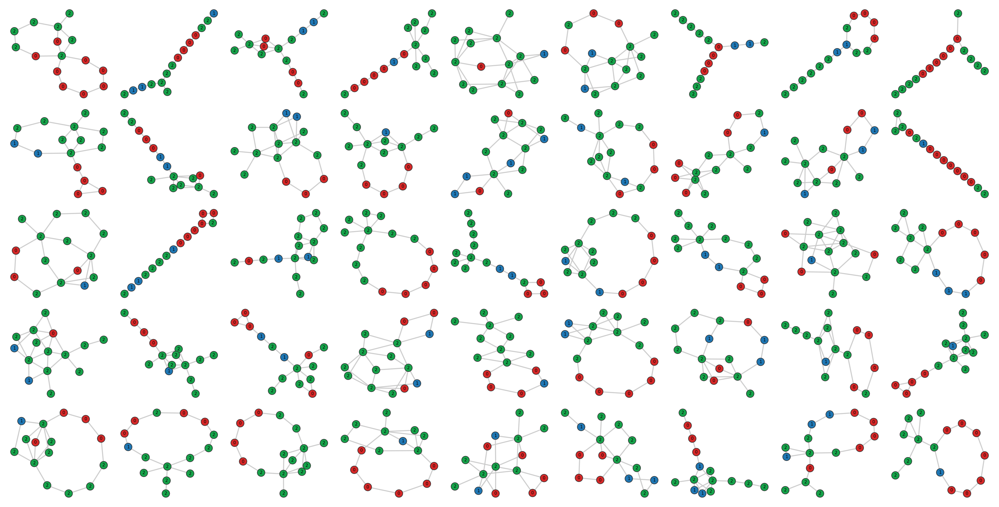

In [ ]:
decompositional_encoder_decoder.conditioning_to_node_embeddings_generator.conditional_node_generator.total_steps = 100

n_rows = 5
n_cols = 9
n_samples = n_rows * n_cols

sampled_graphs = decompositional_encoder_decoder.sample(n_samples=n_samples)

plot_networkx_graphs(
    sampled_graphs,
    n_cols=n_cols,
    figsize_per_graph=(2.2, 2.0),
    node_label_attr="label",
    edge_label_attr="label",
    node_size=120,
    edge_width=1.5,
    font_size=6,
    layout="kamada_kawai",
)


In [ ]:
for i, enc in enumerate(predicted_node_encodings_list[:10]):
    deg = np.rint(enc[:, 1]).astype(int)
    print(i, "pred deg:", deg, "target edges:", deg.sum() / 2)



0 pred deg: [6 2 1 2 2 5 6 2 1 2 1 6 6 5 2] target edges: 24.5
1 pred deg: [2 2 2 2 2 2 5 2 5 5 5 5 2 2 2] target edges: 22.5
2 pred deg: [2 1 2 2 2 2 2 2 1 2 2 2 2 2 6] target edges: 16.0
3 pred deg: [2 6 2 5 2 1 2 2 5 2 2 2 1 2 2] target edges: 19.0
4 pred deg: [2 2 5 1 1 2 2 2 2 2 2 2 2 2 2] target edges: 15.5
5 pred deg: [2 1 2 6 2 2 2 2 1 2 2 2 1 2 2] target edges: 15.5
6 pred deg: [5 2 2 2 6 1 2 2 2 2 2 2 5 1 6] target edges: 21.0
7 pred deg: [2 1 2 5 1 2 2 2 2 2 1 6 2 2 2] target edges: 17.0
8 pred deg: [2 2 2 2 2 2 1 6 2 6 1 2 1 1 2] target edges: 17.0
9 pred deg: [2 1 5 2 2 1 2 1 2 2 5 2 2 2 2] target edges: 16.5
